In [1]:
import ECGDataset 
import Models 
import Net
from train_test_validat import *
from self_attention import *
import matplotlib.pyplot as plt
import ecg_plot
import cam
import ECGplot
import ECGHandle
import torch
import torch.utils.data as Data
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score
import random

import pandas as pd
from tqdm import tqdm
from sklearn.metrics import roc_curve, auc,precision_recall_curve

import time
import math
import os
import gc
from torch.utils.tensorboard import SummaryWriter


def seed_torch(seed=2023):
	random.seed(seed)
	os.environ['PYTHONHASHSEED'] = str(seed) # 为了禁止hash随机化，使得实验可复现
	np.random.seed(seed)
	torch.manual_seed(seed)
	torch.cuda.manual_seed(seed)
	torch.cuda.manual_seed_all(seed) # if you are using multi-GPU.
	torch.backends.cudnn.benchmark = False 
	torch.backends.cudnn.deterministic = True
    # torch.backends.cudnn.enabled = False
    

In [2]:
%matplotlib inline  

In [3]:
EcgChannles_num = 12
EcgLength_num = 5000
DEVICE = "cpu"
seed_torch(2023)
fontdict = {'family' : 'Times New Roman', 'size' : 10}
plt.rc('font',family='Times New Roman')
plt.rcParams['font.sans-serif'] = ['SimHei'] #或者把"SimHei"换为"KaiTi"
plt.rcParams['axes.unicode_minus'] = False  # 解决保存图像是负号'-'显示为方块的问题


In [4]:
data_root = '/workspace/data/Preprocess_HTN/datas_/'
ALL_data = pd.read_csv(data_root+'/All_data_handled_ID_range_age_IDimputate.csv',low_memory=False)
ALL_data = ECGHandle.change_label(ALL_data)
ALL_data = ECGHandle.filter_ID(ALL_data)
ALL_data = ECGHandle.filter_QC(ALL_data)
ALL_data = ECGHandle.filter_ages(ALL_data,18)
ALL_data = ECGHandle.filter_departmentORlabel(ALL_data,'外科')
ALL_data = ECGHandle.correct_label(ALL_data)
ALL_data = ECGHandle.correct_age(ALL_data)
ALL_data = ECGHandle.filter_diagnose(ALL_data,'起搏')
ALL_data = ECGHandle.filter_diagnose(ALL_data,'房颤')
ALL_data = ECGHandle.filter_diagnose(ALL_data,'左束支传导阻滞')
ALL_data = ECGHandle.filter_diagnose(ALL_data,'左前分支阻滞')
ALL_data = ECGHandle.filter_diagnose(ALL_data,'阻滞')
# ALL_data = ECGHandle.remove_duplicated(ALL_data)
ALL_data = ALL_data.rename(columns={'住院号':'ID','年龄':'age','性别':'gender','姓名':'name'}) 

ALL_data_buffer = ALL_data.copy()

seed_torch(2023)
ALL_data_buffer = ALL_data_buffer.sample(frac=1).reset_index(drop=True) #打乱顺序
# ALL_data_buffer = ALL_data_buffer[(ALL_data_buffer['age']>=70) & (ALL_data_buffer['age']<80)]
# all_dataset = ECGHandle.ECG_Dataset(data_root,ALL_data_buffer,preprocess = True)
# test_dataset = all_dataset
####################################################################随机选取test

test_df,tv_df = Pair_ID(ALL_data_buffer,0.2,Range_max=15,pair_num=1)

test_dataset = ECGHandle.ECG_Dataset(data_root,test_df,preprocess = True)



            orginal   removed diagnose NaN
   nums      200082          199997       
              HTN             NHTN        
   nums       3273           196724       


            orginal      removed ID NaN   
   nums      199997          199995       
              HTN             NHTN        
   nums       3273           196722       


            orginal            QC         
   nums      199995          72845        
              HTN             NHTN        
   nums       1497           71348        


            orginal      filtered ages    
   nums      72845           69819        
              HTN             NHTN        
   nums       1477           68342        


            orginal   filtered department 
   nums      69819           15344        
              HTN             NHTN        
   nums       1477           13867        


     reset num:       10  
  ERR labels num:     27  
            orginal      correct label    
   nums      15344           15

AttributeError: 'DataFrame' object has no attribute 'save'

In [5]:
ALL_data.to_csv("./ALL_data_info.csv")

In [5]:
Models_path = '/workspace/data/Interpretable_HTN/model/20230320_011459/20230320_061146/BestF1_2.pt'
save_root = Models_path[:-3]+'/'    
layervalue_root = save_root+'/layervalue/'    
NET = [Net.MLBFNet_GUR_o(True,True,True,2,Dropout_rate=0.3), ] # type: ignore    
criterion = torch.nn.CrossEntropyLoss()    
testmodel = NET[0].to(DEVICE)    
testmodel.load_state_dict(torch.load(Models_path))    
test_dataloader = Data.DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)      
y_true,y_pred,y_out,test_loss,test_acc = eval_model(test_dataloader,criterion,testmodel,DEVICE) # 验证模型

In [6]:
optimal_th = 0.5 #根据验证集得到的，不能在测试集上找,或者直接设置成0.5
y_pred = ((np.array(y_out))[:,1])
y_pred[y_pred>optimal_th] =  int(1)
y_pred[y_pred<=optimal_th] =  int(0)
F1_score_valid =f1_score(y_true, y_pred, average='binary')#F1分数
p_valid = precision_score(y_true, y_pred, average='binary')
r_valid = recall_score(y_true, y_pred, average='binary')   
auc_valid = roc_auc_score(y_true,y_score=((np.array(y_out))[:,1]))
C1 = confusion_matrix(y_true,y_pred)
print(   '\n',C1[0],'\n',C1[1],'\n',"F1_score: ",F1_score_valid,'\n',"precision: ",p_valid,'\n',"recall: ",r_valid,'AUC',auc_valid)


 [225  25] 
 [ 53 264] 
 F1_score:  0.8712871287128714 
 precision:  0.9134948096885813 
 recall:  0.832807570977918 AUC 0.9326940063091483


## 保存输出结果

In [6]:
save_test_infos = test_dataset.infos.copy()
save_test_infos['pred'] = y_pred
save_test_infos['The risk of high blood pressure'] = ((np.array(y_out))[:,1])
save_test_infos.head()

,Unnamed: 0,Unnamed: 0.1,index,序号,name,gender,age,检查时间,申请部门,门诊号,...,ECG-R+S,急诊号_1,出生日期,year,ECGFilename,xmlPath,Q,label,pred,The risk of high blood pressure
9,64713,64713,24666,24667,王阿玲,女,67,2020-01-08 16:43:36,内分泌糖尿病科病房,NaN,...,2.17,NaN,NaN,20,20-24667,/workspace/data/Preprocess_HTN/2020/2020/24667...,0.0,1,1.0,0.834408
10,173584,173584,262,263,卓龙保,男,64,NaN,NaN,NaN,...,NaN,NaN,1954-07-22,0,00-1-263,/workspace/data/Preprocess_HTN/00/00/HTN/xml/2...,0.0,1,1.0,0.999032
18,166137,166137,32875,32877,陈国杰,男,88,2022-04-18 09:15:40,干部保健二科一区,NaN,...,0.00,NaN,NaN,22,22-32877,/workspace/data/Preprocess_HTN/2022/32877/1.xml,0.0,1,1.0,0.989363
33,173497,173497,175,176,傅丽美,女,55,NaN,NaN,NaN,...,NaN,NaN,1964-02-16,0,00-1-176,/workspace/data/Preprocess_HTN/00/00/HTN/xml/1...,0.0,1,1.0,0.987498
45,86114,86114,2639,2640,肖火旺,男,71,2021-01-18 11:50:08,肝胆胰血管外科病房,NaN,...,2.26,NaN,NaN,21,21-1-2640,/workspace/data/Preprocess_HTN/2021/2021-1/264...,0.0,0,0.0,0.038521


In [7]:
save_test_infos.to_csv('ALL_2023_answer.csv', encoding='utf-8-sig')

## 获取importance

In [8]:
# 定义获取梯度的函数
fmap_block = list()
grad_block = list()

# 获取反向的传播图
def backward_hook(module, grad_in, grad_out):
    # print('backward_hook ',len(grad_out),grad_out[0].shape)
    grad_block.append(grad_out[0].clone().cpu().detach())

# 定义获取特征图的函数
def farward_hook(module, input, output):
    # print('farward_hook ',output.shape)
    fmap_block.append(output.clone().cpu().detach())

In [9]:
def scaled_layer_cam_max(cam):
    (cam_min, cam_max) = (cam.min(), cam.max())
    norm_cam = (cam - cam_min) / (((cam_max - cam_min) + 1e-08))
    return norm_cam
def scaled_layer_cam_tanh(cam,gamma = 2.):
    (cam_min, cam_max) = (cam.min(), cam.max())
    norm_cam = np.tanh(gamma*cam/cam_max)
    return norm_cam

In [10]:
save_root = Models_path[:-3]+'/'
layervalue_root = save_root+'/layervalue/'
layervalue_root1 = save_root+'/layer1/'
if(not(os.path.exists(save_root))): os.mkdir(save_root)
if(not(os.path.exists(layervalue_root))): os.mkdir(layervalue_root)
if(not(os.path.exists(layervalue_root1))): os.mkdir(layervalue_root1)

lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
x_index = np.arange(0,12)
# fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True,sharey=True,figsize=(45,25), constrained_layout=True,dpi =100)
for index in tqdm(range( test_dataset.__len__())):# test_dataset.__len__()
    NET = [Net.MLBFNet_GUR_o(True,True,True,2,Dropout_rate=0.3), ] # type: ignore
    testmodel = NET[0].to(DEVICE)
    testmodel.load_state_dict(torch.load(Models_path))
    testmodel.conv1.register_forward_hook(farward_hook)	#正向传播
    testmodel.conv1.register_full_backward_hook(backward_hook)#反向传播
    testmodel.conv2.register_forward_hook(farward_hook)	#正向传播
    testmodel.conv2.register_full_backward_hook(backward_hook)#反向传播
    testmodel.layers_list_2d[0].register_forward_hook(farward_hook)	#正向传播
    testmodel.layers_list_2d[0].register_full_backward_hook(backward_hook)#反向传播
    testmodel.layers_list_2d[1].register_forward_hook(farward_hook)	#正向传播
    testmodel.layers_list_2d[1].register_full_backward_hook(backward_hook)#反向传播
    testmodel.layers_list_2d[2].register_forward_hook(farward_hook)	#正向传播
    testmodel.layers_list_2d[2].register_full_backward_hook(backward_hook)#反向传播


    inputs,labels = test_dataset.__getitem__(index)
    info =test_dataset.infos.iloc[index]
    ECGfile_name = info['ECGFilename']
    testmodel.eval()
    fmap_block = list()
    grad_block = list()

    labels = labels.unsqueeze(0) # 在首位添加1维作为batchsize
    inputs = inputs.unsqueeze(0) # 在首位添加1维作为batchsize

    inputs = inputs.to(DEVICE)
    labels = labels.to(DEVICE)  

    outputs = testmodel(inputs)
    # print('outputs',outputs)
    _,pred = outputs.max(1)     # 求概率最大值对应的标签
    possibility = nn.functional.softmax(outputs,dim=-1)
    # print("labels: {}".format(labels))
    # print("predict: {}".format(pred))
    # print("possibility: {}".format(possibility))
    loss = outputs[0,pred]      # 网络对应于pred的类别的输出即为loss
    loss.backward(retain_graph=True)  #retain_graph=True，目的为是为保留该过程中计算的梯度，后续G网络更新时使用

    fmap1 = (fmap_block[0][0]).to('cpu').detach().numpy()
    gradmap1 = (grad_block[4][0]).to('cpu').detach().numpy()#G是从后往前的，conv1的在后面
    layer2d_vlue1 = cam.caculate_layer_cam_vlue_2d(fmap1,gradmap1,scale_tanh = True)# ,scale_tanh = True

    fmap2 = (fmap_block[1][0]).to('cpu').detach().numpy()
    gradmap2 = (grad_block[3][0]).to('cpu').detach().numpy()
    layer2d_vlue2 = cam.caculate_layer_cam_vlue_2d(fmap2,gradmap2,scale_tanh = True)

    fmap2d_1 = (fmap_block[2][0]).to('cpu').detach().numpy()
    gradmap2d_1 = (grad_block[2][0]).to('cpu').detach().numpy()
    layer2d_vlue2d_1 = cam.caculate_layer_cam_vlue_2d(fmap2d_1,gradmap2d_1)

    fmap2d_2 = (fmap_block[3][0]).to('cpu').detach().numpy()
    gradmap2d_2 = (grad_block[1][0]).to('cpu').detach().numpy()
    layer2d_vlue2d_2 = cam.caculate_layer_cam_vlue_2d(fmap2d_2,gradmap2d_2)

    fmap2d_3 = (fmap_block[4][0]).to('cpu').detach().numpy()
    gradmap2d_3 = (grad_block[0][0]).to('cpu').detach().numpy()
    layer2d_vlue2d_3 = cam.caculate_layer_cam_vlue_2d(fmap2d_3,gradmap2d_3)

    layer_vlue_mean = np.stack((layer2d_vlue1, layer2d_vlue2,layer2d_vlue2d_1,layer2d_vlue2d_2,layer2d_vlue2d_3), axis=0).max(axis=0)
    np.save(layervalue_root+ECGfile_name,layer_vlue_mean)
    np.save(layervalue_root1+ECGfile_name,np.array(layer2d_vlue1))
    
    
#     inputs,_ = test_dataset.__getitem__(index)
#     cmap = 'OrRd' 
#     colors = ECGplot.color_map(layer_vlue_mean, cmap)#相当于归一化

#     for i,ax in enumerate(axs.flat):  # type: ignore
#         plot_y = np.array(inputs[i]*5000.)#缩放
#         t = np.arange(0,5000)
#         ECGplot.plot_ECG_line(fig,ax,x = t,y= plot_y,y_name = str(lead_index[i])+" Voltage(mV)",title = lead_index[i])
#         for j in t:
#             ax.axvline(x=j,alpha=0.1,color=colors[i,j]) #第i导联 第j个时间点的importance value
#     plt.savefig(save_root+'/'+info['ECGFilename']+'_'+str(labels[0].tolist())+'_'+str(pred[0].tolist())+'.png', bbox_inches='tight',dpi = 200)  
# plt.close()  

100%|██████████| 567/567 [18:49<00:00,  1.99s/it]


In [11]:
layer2d_vlue1.max()

0.89235646

In [12]:
layer2d_vlue2.max()

0.96098834

In [13]:
layer2d_vlue2d_1.max()

0.17065509

In [14]:
layer2d_vlue2d_2.max()

9.059654e-06

In [15]:
layer2d_vlue2d_3.max()

0.0009585206

## 分割对齐 获取单个心拍的layercam和ECG值 

In [7]:
from scipy import signal

def segement_upsample(segement:np.ndarray,segement_num:int = 10):
    chanle_num = segement.shape[0]
    segement = torch.DoubleTensor(segement).unsqueeze(0).unsqueeze(0)# type: ignore    
    upsampler = nn.Upsample(size=(chanle_num,segement_num),  mode='bilinear',align_corners=True)
    segement_upsampled = upsampler(segement)
    return np.array(segement_upsampled.squeeze(0).squeeze(0))
    
def leads_layervalue_segement_count_upsample(start_index:int,end_index:int,layervalue:np.ndarray,segement_num:int = 10):
    len_ = end_index-start_index
    if(len_<=0):
        print('err')
        return 0
    layervalue_sum = segement_upsample(layervalue[:,start_index:end_index] ,segement_num)#插值成segement_num步=
    return layervalue_sum
    
def max_min(x):
    max_ = x.max()
    min_ = x.min()
    x_ = (x-min_)/(max_-min_+1e-8)
    return x_

def isoline_correction(ECG:np.ndarray):
    ecg_data = ECG
    for lead in range(ECG.shape[0]):
        b, a = signal.butter(8, 0.01, 'lowpass')   #配置滤波器 8 表示滤波器的阶数
        ecg_outline_data = signal.filtfilt(b, a, ecg_data[lead])  #data为要过滤的信号
        ecg_norm_data = ecg_data - ecg_outline_data
        avg = sum(ecg_data[lead])/len(ecg_data[lead])
        for i in range(len(ecg_data[lead])):
            ecg_data[lead][i] = ecg_data[lead][i] - avg
    return ecg_data

In [8]:
layervalue_root = save_root+'/layer1/'  
waves_location_file_root = '/workspace/data/Preprocess_HTN/datas_/Wave/'
select_list =['P_start', 'P_peak','Q_start', 'Q_peak', 'R_peak', 'S_peak', 'S_end','T_start', 'T_peak', 'T_end']
segement_num = 100 # 共select_list-1个片段，每段划分成100份
important_values = np.zeros([C1[1][1],len(select_list)-1,12,segement_num]) #278 是已知的分对的HTN的数量，为了统计std临时加的
ECG_values = np.zeros([C1[1][1],len(select_list)-1,12,segement_num])

sample_count = 0
for index in range(test_dataset.__len__()):#test_dataset.__len__()
   
    important_value = np.zeros([len(select_list)-1,12,segement_num])
    ECG_value = np.zeros([len(select_list)-1,12,segement_num])
    
    info =test_dataset.infos.iloc[index]
    ECG,labels = test_dataset.__getitem__(index)
    ECG = ECG*5000 #恢复
    ECG_dignose_isoline = isoline_correction(np.array(ECG))
    if(labels != y_true[index]): 
        break
    pred = y_pred[index]
    if(((pred == labels) and (pred == 1))): 
        
        ECGfile_name = info['ECGFilename']
        layervalue_file = layervalue_root  + ECGfile_name +'.npy'
        waves = np.load(waves_location_file_root+'/FPT/'+ECGfile_name+'.npy')
        layervalue = np.load(layervalue_file)
        waves_ = pd.DataFrame(waves[1:-1],columns=['P_start', 'P_peak', 'P_end','Q_start', 'Q_peak', 'R_peak', 'S_peak', 'S_end','J','T_start', 'T_peak', 'T_end','res0'])
        waves = waves_[select_list].copy()
        if(waves.isnull().any().any()):
            continue
        for bet in range(len(waves.index)):
            
            for peak in range(len(waves.columns)-1):
                start = int(waves.loc[bet][peak])
                end = int(waves.loc[bet][peak+1])
                if (start >= end): continue
                important_value[peak] = important_value[peak] + leads_layervalue_segement_count_upsample(start,end,layervalue,segement_num)
                ECG_value[peak] = ECG_value[peak]+ leads_layervalue_segement_count_upsample(start,end,ECG_dignose_isoline,segement_num)
                
        ECG_value = ECG_value/len(waves.index)#按心拍数平均一下 
        # ECG_value_leads_max = ECG_value.swapaxes(0,1).reshape([12,-1]).max(1).reshape([12,1]) #每个导联归一化
        # ECG_value_leads_min = ECG_value.swapaxes(0,1).reshape([12,-1]).min(1).reshape([12,1])
        # ECG_value = ((ECG_value.swapaxes(0,1).reshape([12,-1])-ECG_value_leads_min)/(ECG_value_leads_max-ECG_value_leads_min)).reshape([12,len(select_list)-1,segement_num]).swapaxes(0,1)
        # ECG_values = ECG_values +ECG_value
        ECG_values[sample_count] = ECG_value
        important_value = important_value/len(waves.index)#按心拍数平均一下
        # important_value_leads_max = important_value.swapaxes(0,1).reshape([12,-1]).max(1).reshape([12,1])#每个导联归一化
        # important_value_leads_min = important_value.swapaxes(0,1).reshape([12,-1]).min(1).reshape([12,1])
        # important_value = ((important_value.swapaxes(0,1).reshape([12,-1])-important_value_leads_min)/(important_value_leads_max-important_value_leads_min)).reshape([12,len(select_list)-1,segement_num]).swapaxes(0,1)
        important_value = max_min(important_value)
        # important_values = important_values + important_value
        important_values[sample_count] = important_value
        sample_count = sample_count +1
HTN_important_values = important_values #按样本数平均一下
HTN_ECG_values = ECG_values
print(sample_count)

264


In [9]:
len(HTN_ECG_values)

264

In [10]:
waves_location_file_root = '/workspace/data/Preprocess_HTN/datas_/Wave/'
select_list =['P_start', 'P_peak','Q_start', 'Q_peak', 'R_peak', 'S_peak', 'S_end','T_start', 'T_peak', 'T_end']
segement_num = 100 # 共select_list-1个片段，每段划分成100份
important_values = np.zeros([C1[0][0],len(select_list)-1,12,segement_num]) #225 是已知的分对的HTN的数量，为了统计std临时加的
ECG_values = np.zeros([C1[0][0],len(select_list)-1,12,segement_num])
""
sample_count = 0
for index in range(test_dataset.__len__()):#test_dataset.__len__()
   
    important_value = np.zeros([len(select_list)-1,12,segement_num])
    ECG_value = np.zeros([len(select_list)-1,12,segement_num])
    
    info =test_dataset.infos.iloc[index]
    ECG,labels = test_dataset.__getitem__(index)
    ECG = ECG*5000 #恢复
    ECG_dignose_isoline = isoline_correction(np.array(ECG))
    if(labels != y_true[index]): 
        break
    pred = y_pred[index]
    if(((pred == labels) and (pred == 0))): 
        
        ECGfile_name = info['ECGFilename']
        layervalue_file = layervalue_root  + ECGfile_name +'.npy'
        waves = np.load(waves_location_file_root+'/FPT/'+ECGfile_name+'.npy')
        layervalue = np.load(layervalue_file)
        waves_ = pd.DataFrame(waves[1:-1],columns=['P_start', 'P_peak', 'P_end','Q_start', 'Q_peak', 'R_peak', 'S_peak', 'S_end','J','T_start', 'T_peak', 'T_end','res0'])
        waves = waves_[select_list].copy()
        if(waves.isnull().any().any()):
            continue
        for bet in range(len(waves.index)):
            
            for peak in range(len(waves.columns)-1):
                start = int(waves.loc[bet][peak])
                end = int(waves.loc[bet][peak+1])
                if (start >= end): continue
                important_value[peak] = important_value[peak] + leads_layervalue_segement_count_upsample(start,end,layervalue,segement_num)
                ECG_value[peak] = ECG_value[peak]+ leads_layervalue_segement_count_upsample(start,end,ECG_dignose_isoline,segement_num)
                
        ECG_value = ECG_value/len(waves.index)#按心拍数平均一下 
        # ECG_value_leads_max = ECG_value.swapaxes(0,1).reshape([12,-1]).max(1).reshape([12,1]) #每个导联归一化
        # ECG_value_leads_min = ECG_value.swapaxes(0,1).reshape([12,-1]).min(1).reshape([12,1])
        # ECG_value = ((ECG_value.swapaxes(0,1).reshape([12,-1])-ECG_value_leads_min)/(ECG_value_leads_max-ECG_value_leads_min)).reshape([12,len(select_list)-1,segement_num]).swapaxes(0,1)
        # ECG_values = ECG_values +ECG_value
        ECG_values[sample_count] = ECG_value
        important_value = important_value/len(waves.index)#按心拍数平均一下
        # important_value_leads_max = important_value.swapaxes(0,1).reshape([12,-1]).max(1).reshape([12,1])#每个导联归一化
        # important_value_leads_min = important_value.swapaxes(0,1).reshape([12,-1]).min(1).reshape([12,1])
        # important_value = ((important_value.swapaxes(0,1).reshape([12,-1])-important_value_leads_min)/(important_value_leads_max-important_value_leads_min)).reshape([12,len(select_list)-1,segement_num]).swapaxes(0,1)
        important_value = max_min(important_value)
        # important_values = important_values + important_value
        important_values[sample_count] = important_value
        sample_count = sample_count +1
NHTN_important_values = important_values #按样本数平均一下
NHTN_ECG_values = ECG_values
print(sample_count)

225


In [11]:
len(NHTN_ECG_values)

225

In [12]:
NHTN_ECG_values.shape

(225, 9, 12, 100)

## get each segment interval

In [13]:
waves_location_file_root = '/workspace/data/Preprocess_HTN/datas_/Wave/'
select_list =['P_start', 'P_peak','Q_start', 'Q_peak', 'R_peak', 'S_peak', 'S_end','T_start', 'T_peak', 'T_end']
segement_num = 100 # 共6个片段，每段划分成10份

interval_values = np.zeros([len(select_list)-1]) #

sample_count = 0
for index in tqdm(range(test_dataset.__len__())):#test_dataset.__len__()
   
    interval_value = np.zeros([len(select_list)-1])

    
    info =test_dataset.infos.iloc[index]
    ECG,labels = test_dataset.__getitem__(index)
    ECG = ECG*5000 #恢复
    ECG_dignose_isoline = isoline_correction(np.array(ECG))
    if(labels != y_true[index]): 
        break
    pred = y_pred[index]
    if(((pred == labels))): 
        
        ECGfile_name = info['ECGFilename']
        waves = np.load(waves_location_file_root+'/FPT/'+ECGfile_name+'.npy')
        waves_ = pd.DataFrame(waves[1:-1],columns=['P_start', 'P_peak', 'P_end','Q_start', 'Q_peak', 'R_peak', 'S_peak', 'S_end','J','T_start', 'T_peak', 'T_end','res0'])
        waves = waves_[select_list].copy()
        if(waves.isnull().any().any()):
            continue
        for bet in range(len(waves.index)):
            for peak in range(len(waves.columns)-1):
                start = int(waves.loc[bet][peak])
                end = int(waves.loc[bet][peak+1])
                if (start >= end): continue
                interval_value[peak] = interval_value[peak]+ end-start
        interval_value = interval_value/len(waves.index)#按心拍数平均一下 
        interval_values = interval_values + interval_value
        sample_count = sample_count +1
interval_rate = (interval_values)/(interval_values.max()) #片段长度与最大值之比
print(interval_rate)

100%|██████████| 567/567 [00:45<00:00, 12.54it/s]

[0.63753019 0.70146765 0.20947897 0.26961575 0.31536763 0.20947897
 0.60353556 1.         0.67536114]


In [14]:
interval_rate

array([0.63753019, 0.70146765, 0.20947897, 0.26961575, 0.31536763,
       0.20947897, 0.60353556, 1.        , 0.67536114])

## 按照interval_rate 折叠

In [15]:
# N,S,C,L -> N,C,scaled_num
# orginal_sequence_values:(N,S,C,L), 
# interval_rate：(S,) target lenth:orginal_segement lenth for each orginal_segement
# segment_index: start index of each segment in scaled_sequence
def scaled_sequen_lenth_by_interval_rate(orginal_sequence_values:np.ndarray,interval_rate:np.ndarray):
    N,S,C,L = orginal_sequence_values.shape #S:orginal_segement_num C:channel_size L：len of each orginal_segement
    len_after_scaled = np.array((L*interval_rate),int).sum() # sum of all target lenths
    scaled_sequence = np.zeros([N,12,len_after_scaled])
    # print(scaled_sequence.shape)
    segment_index = [0]#首位用0展位，每一次加上上一个的坐标
    for index in range(S):
        scaled_segment_len = int(segement_num*interval_rate[index])#
        start = segment_index[index]
        end = start + scaled_segment_len
        if(end > np.array((segement_num*interval_rate),int).sum()) :
            print('out of range!')
            break
        scaled_sequence[:,:,start:end] = ((segement_upsample_NCL(orginal_sequence_values[:,index],scaled_segment_len)))
        segment_index.append(scaled_segment_len+segment_index[index])#首位用0展位，每一次加上上一个的坐标
    return scaled_sequence,segment_index

def segement_upsample_NCL(segement:np.ndarray,segement_num:int = 10):
    N,C,L = segement.shape
    # print(segement.shape)
    segement = torch.DoubleTensor(segement)# type: ignore #  N,C,L
    # print(segement.shape)
    upsampler = nn.Upsample(size=(segement_num),  mode='linear',align_corners=True)#N,C,L -> N,C,segement_num
    segement_upsampled = upsampler(segement)
    # print(np.array(segement_upsampled).shape)
    return np.array(segement_upsampled)


In [16]:
HTN_colors_z,segment_index = scaled_sequen_lenth_by_interval_rate(HTN_important_values,interval_rate)
NHTN_colors_z,segment_index =scaled_sequen_lenth_by_interval_rate(NHTN_important_values,interval_rate)
HTN_ECG_y,segment_index = scaled_sequen_lenth_by_interval_rate(HTN_ECG_values,interval_rate)
NHTN_ECG_y,segment_index =scaled_sequen_lenth_by_interval_rate(NHTN_ECG_values,interval_rate)

In [17]:
HTN_colors_z.shape

(264, 12, 457)

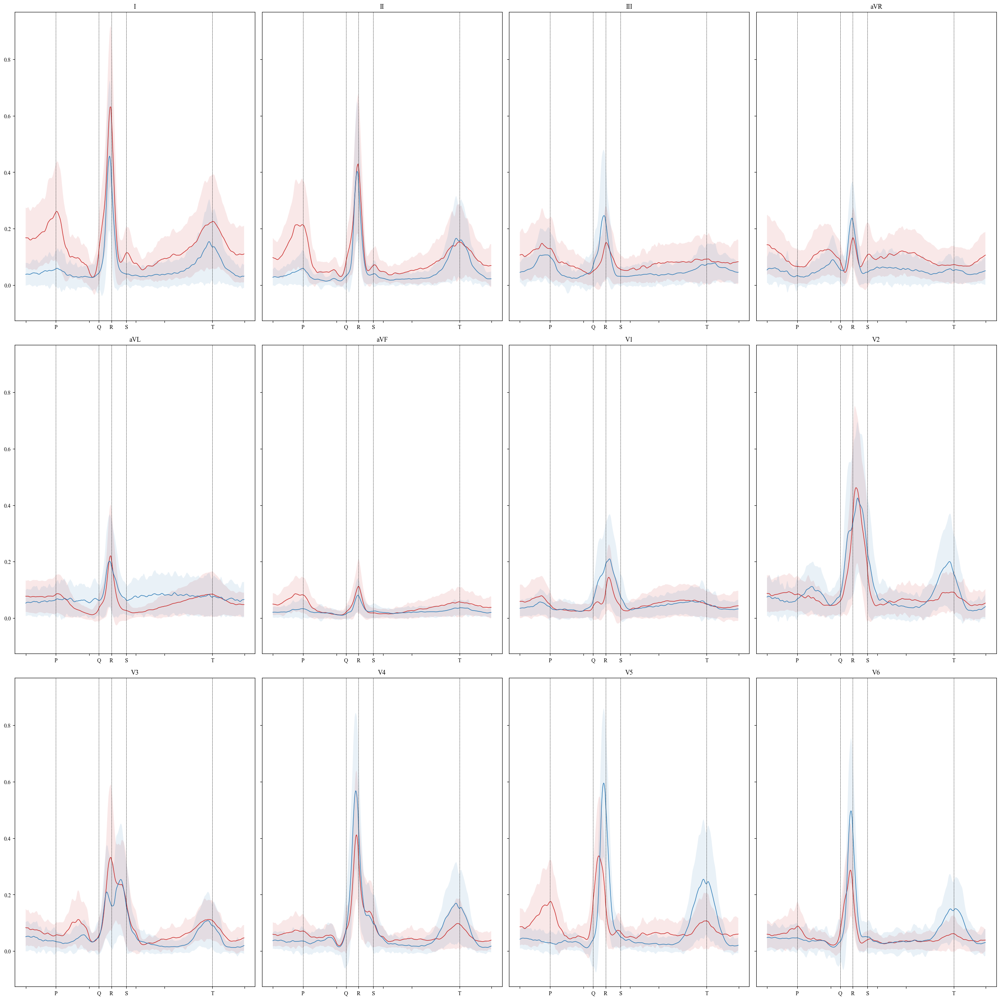

In [25]:
lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
xticks_list = segment_index
xticks_label = ['','P','','Q','R','S','','','T','']

fig, axs = plt.subplots(nrows=3, ncols=4,sharey=True,figsize=(25,25), constrained_layout=True,dpi =100)
t = np.arange(0,HTN_colors_z.shape[-1]) #总步长 L 
# HTN_colors = ECGplot.color_map(((HTN_important_values.reshape([12,-1]))), 'autumn')#相当于归一化
# NHTN_colors = ECGplot.color_map(((NHTN_important_values.reshape([12,-1]))), 'YlGnBu')#相当于归一化
for i,ax in enumerate(axs.flat):  # type: ignore
    ax.plot(t, (HTN_colors_z.mean(axis = 0)[i]), lw=1,color='#C82423')
    ax.fill_between(t, 
                    (HTN_colors_z.mean(axis = 0)[i])-(HTN_colors_z.std(axis = 0)[i]), 
                    (HTN_colors_z.mean(axis = 0)[i])+(HTN_colors_z.std(axis = 0)[i]),
                    facecolor='#C82423', alpha=0.1)
    ax.plot(t, (NHTN_colors_z.mean(axis = 0)[i]), lw=1,color='#2878B5') 
    ax.fill_between(t, 
                    (NHTN_colors_z.mean(axis = 0)[i])-(NHTN_colors_z.std(axis = 0)[i]), 
                    (NHTN_colors_z.mean(axis = 0)[i])+(NHTN_colors_z.std(axis = 0)[i]),
                    facecolor='#2878B5', alpha=0.1)    
    for j in range(len(xticks_label)):
        if(xticks_label[j] == ''): continue
        ax.axvline(x=int(xticks_list[j]),ls='dashed',lw=0.5,color='k')
        
    ax.set_xticks(xticks_list) # 设置刻度
    ax.set_xticklabels(xticks_label)
    ax.set_title(lead_index[i])

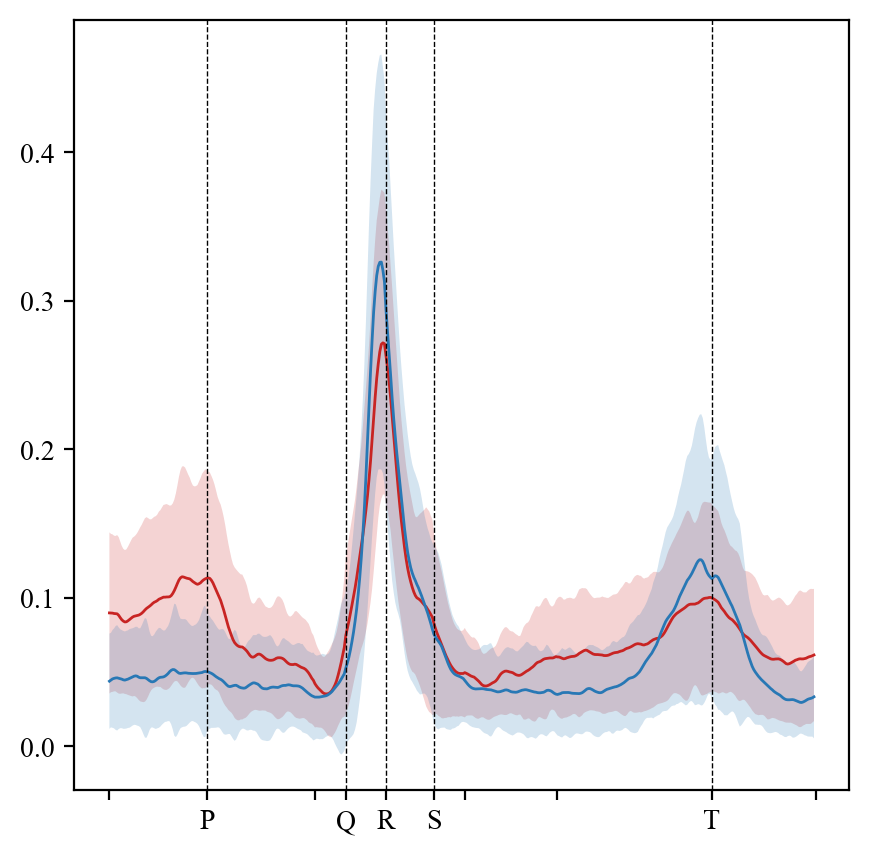

In [26]:
HTN_colors_z_ALL = HTN_colors_z.mean(axis=1) #N,C,L -> N,L
NHTN_colors_z_ALL = NHTN_colors_z.mean(axis=1) #N,C,L -> N,L

xticks_list = segment_index
xticks_label = ['','P','','Q','R','S','','','T','']
fig, axs = plt.subplots(nrows=1, ncols=1,figsize=(5,5), dpi =200)    

t = np.arange(0,HTN_colors_z_ALL.shape[-1]) #  (L,)

axs.plot(t, (HTN_colors_z_ALL).mean(axis = 0),lw=1, color='#C82423') 
axs.fill_between(t, 
                (HTN_colors_z_ALL.mean(axis = 0))-(HTN_colors_z_ALL.std(axis = 0)), 
                (HTN_colors_z_ALL.mean(axis = 0))+(HTN_colors_z_ALL.std(axis = 0)),
                facecolor='#C82423', alpha=0.2)

axs.plot(t, (NHTN_colors_z_ALL.mean(axis = 0)),lw=1, color='#2878B5') 
axs.fill_between(t, 
                (NHTN_colors_z_ALL.mean(axis = 0))-(NHTN_colors_z_ALL.std(axis = 0)), 
                (NHTN_colors_z_ALL.mean(axis = 0))+(NHTN_colors_z_ALL.std(axis = 0)),
                facecolor='#2878B5', alpha=0.2)

axs.set_xticks(xticks_list) # 设置刻度
axs.set_xticklabels(xticks_label)
for j in range(len(xticks_label)):
    if(xticks_label[j] == ''): continue
    axs.axvline(x=int(xticks_list[j]),ls='dashed',lw=0.5,color='k')

In [27]:
plt.rc('font',family='Times New Roman')
plt.rcParams.update ( {'font.size': 11}) 

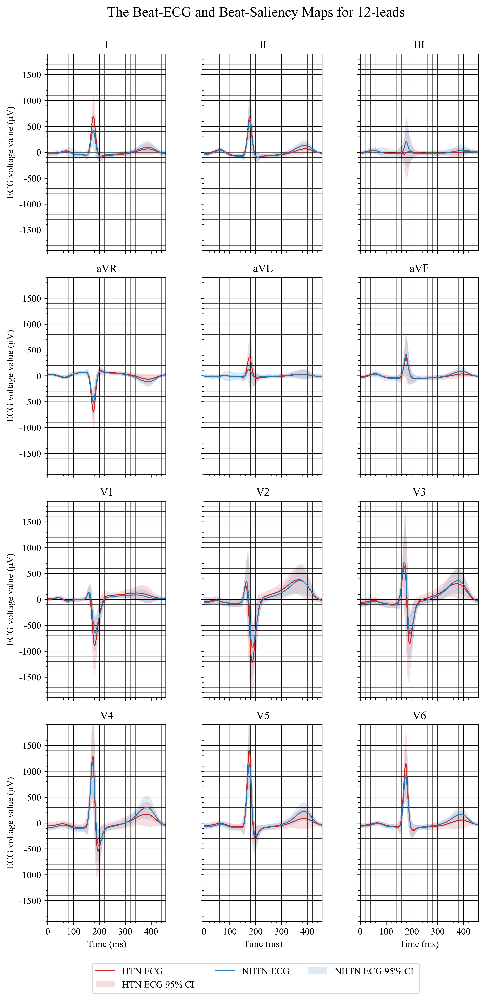

In [109]:
lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
xticks_list = segment_index
xticks_label = ['','P','','Q','R','S','','','T','']

fig, axs = plt.subplots(nrows=4, ncols=3,figsize=(8,14),dpi = 600)
t = np.arange(0,HTN_ECG_y.shape[-1]) #总步长 L 
# HTN_colors = ECGplot.color_map(((HTN_important_values.reshape([12,-1]))), 'autumn')#相当于归一化
# NHTN_colors = ECGplot.color_map(((NHTN_important_values.reshape([12,-1]))), 'YlGnBu')#相当于归一化
for i,ax in enumerate(axs.flat):  # type: ignore
    
    ax.plot(t, (HTN_ECG_y.mean(axis = 0)[i]), lw=1,color='#C82423',label='HTN ECG')
    ax.fill_between(t, 
                    (HTN_ECG_y.mean(axis = 0)[i])-(HTN_ECG_y.std(axis = 0)[i]), 
                    (HTN_ECG_y.mean(axis = 0)[i])+(HTN_ECG_y.std(axis = 0)[i]),
                    facecolor='#C82423', alpha=0.15,label='HTN ECG 95% CI ')
    
    ax.plot(t, (NHTN_ECG_y.mean(axis = 0)[i]), lw=1,color='#2878B5',label='NHTN ECG') 
    ax.fill_between(t, 
                    (NHTN_ECG_y.mean(axis = 0)[i])-(NHTN_ECG_y.std(axis = 0)[i]), 
                    (NHTN_ECG_y.mean(axis = 0)[i])+(NHTN_ECG_y.std(axis = 0)[i]),
                    facecolor='#2878B5', alpha=0.15,label='NHTN ECG 95% CI ') 
    
    ax.set_ylim(-1900, +1900)
    ax.set_xlim(0, HTN_ECG_y.shape[-1])
    ax.set_aspect(0.2)#用于设置轴缩放的方面，即y-unit与x-unit的比率
    
    
    ax.xaxis.set_major_locator(plt.MultipleLocator(100))# type: ignore # 100*0.002s=0.2s = 5格
    ax.xaxis.set_minor_locator(plt.MultipleLocator(20)) # type: ignore # 20*0.002=0.004S = 1格
    ax.yaxis.set_major_locator(plt.MultipleLocator(500))# type: ignore # 0.1uv*500 = 0.5ms = 5格
    ax.yaxis.set_minor_locator(plt.MultipleLocator(100))# type: ignore # 0.1uv*100 =0.1ms = 1格 
    ax.grid(which='major', axis='x', linewidth=0.5, linestyle='-', color='k')
    ax.grid(which='minor', axis='x', linewidth=0.2, linestyle='-', color='k')
    ax.grid(which='major', axis='y', linewidth=0.5, linestyle='-', color='k')
    ax.grid(which='minor', axis='y', linewidth=0.2, linestyle='-', color='k')
    if(i == 0 or i == 3  or i == 6):
        ax.set_ylabel('ECG voltage value (μV)', fontdict=fontdict)
        ax.axes.xaxis.set_ticklabels([])
    elif(i == 9):
        ax.set_ylabel('ECG voltage value (μV)', fontdict=fontdict)
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
    elif(i >9):
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
        ax.axes.yaxis.set_ticklabels([])
    else:
        ax.axes.xaxis.set_ticklabels([])
        ax.axes.yaxis.set_ticklabels([])
    # ax1 = ax.twinx()
    # ax1.bar(t, (HTN_colors_z.mean(axis = 0)[i]),lw=2, alpha=.4, color='#C82423',label='HTN Saliency') 
    # ax1.bar(t, (NHTN_colors_z.mean(axis = 0)[i]),lw=2, alpha=.4, color='#2878B5',label='NHTN Saliency') 
    
    # ax1.set_ylim(0., 2.5)
    # if(i == 2 or i == 5 or i == 8 or i == 11):
    #     ax1.set_ylabel('Saliency', fontdict=fontdict)
    #     ax1.yaxis.set_ticks([0.5,1.0])
    # else:
    #     ax1.yaxis.set_ticks([])
    
    
    # plt.title('ECG and Saliency for Beat')
    # axs.legend(loc="upper left")
    # ax1.legend(loc="best")
    # for j in range(len(xticks_label)):
    #     if(xticks_label[j] == ''): continue
    #     ax.axvline(x=int(xticks_list[j]),ls=':',lw=0.5,color='k')
        
    # ax.set_xticks(xticks_list) # 设置刻度
    # ax.set_xticklabels(xticks_label)
    
    ax.set_title(lead_index[i])
    
ax.get_shared_y_axes()    

handles, labels = ax.get_legend_handles_labels()
# handles1, labels1 = ax1.get_legend_handles_labels()
# handles = handles+handles1
fig.legend(handles=handles,loc='upper center', bbox_to_anchor=(0.5,0),ncol=3)
# 调整子图间距
plt.tight_layout()
# 设置大图的标题，并将y参数设为1.05，使其位于大图之外
fig.suptitle('The Beat-ECG and Beat-Saliency Maps for 12-leads', fontsize=15,y=1.0005)
fig.tight_layout()
plt.savefig("The Beat-ECG and Beat-Saliency Maps for 12-leads.pdf", transparent=True)


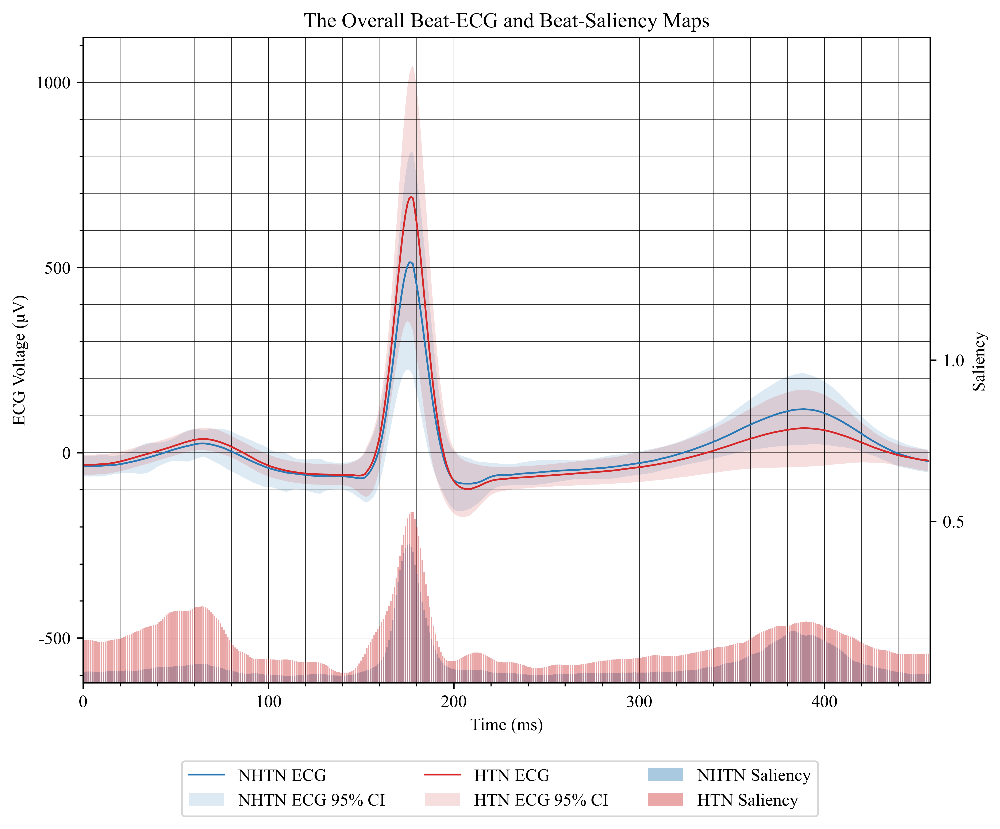

In [108]:
np.save(save_root+"HTN_ECG_y_ALL.npy",HTN_ECG_y)
np.save(save_root+"NHTN_ECG_y_ALL.npy",NHTN_ECG_y)
np.save(save_root+"HTN_layervalue_detail_z_ALL.npy",HTN_colors_z)

np.save(save_root+"NHTN_layervalue_detail_z_ALL.npy",NHTN_colors_z)

HTN_ECG_y_ALL = HTN_ECG_y[:,0:2,:].mean(axis=1) #N,C,L -> N,L
NHTN_ECG_y_ALL = NHTN_ECG_y[:,0:2,:].mean(axis=1) #N,C,L -> N,L
HTN_colors_z_ALL = HTN_colors_z[:,0:2,:].mean(axis=1) #N,C,L -> N,L
NHTN_colors_z_ALL = NHTN_colors_z[:,0:2,:].mean(axis=1) #N,C,L -> N,L


xticks_list = segment_index
xticks_label = ['','P','','Q','R','S','','','T','']
fig, axs = plt.subplots(nrows=1, ncols=1,figsize=(8,6) , dpi =600) #  

t = np.arange(0,HTN_ECG_y_ALL.shape[-1]) #  (L,)

axs.plot(t, (NHTN_ECG_y_ALL.mean(axis = 0)),lw=1, color='#2878B5',label='NHTN ECG') 
axs.fill_between(t, 
                (NHTN_ECG_y_ALL.mean(axis = 0))-(NHTN_ECG_y_ALL.std(axis = 0)), 
                (NHTN_ECG_y_ALL.mean(axis = 0))+(NHTN_ECG_y_ALL.std(axis = 0)),
                facecolor='#2878B5', alpha=.15, label='NHTN ECG 95% CI ')

axs.plot(t, (HTN_ECG_y_ALL).mean(axis = 0),lw=1, color='C82423',label='HTN ECG') 
axs.fill_between(t, 
                (HTN_ECG_y_ALL.mean(axis = 0))-(HTN_ECG_y_ALL.std(axis = 0)), 
                (HTN_ECG_y_ALL.mean(axis = 0))+(HTN_ECG_y_ALL.std(axis = 0)),
                facecolor='#C82423', alpha=.15,label='HTN ECG 95% CI ')


axs.set_ylabel('ECG Voltage (μV)', fontdict=fontdict)
axs.set_xlabel('Time (ms)', fontdict=fontdict)
axs.set_ylim(-1500, +2000)
axs.set_xlim(0, HTN_ECG_y_ALL.shape[-1])
axs.set_aspect(0.2)#用于设置轴缩放的方面，即y-unit与x-unit的比率
axs.xaxis.set_major_locator(plt.MultipleLocator(100))# type: ignore # 100*0.002s=0.2s = 5格
axs.xaxis.set_minor_locator(plt.MultipleLocator(20)) # type: ignore # 20*0.002=0.004S = 1格
axs.yaxis.set_major_locator(plt.MultipleLocator(500))# type: ignore # 0.1uv*500 = 0.5ms = 5格
axs.yaxis.set_minor_locator(plt.MultipleLocator(100))# type: ignore # 0.1uv*100 =0.1ms = 1格 
axs.grid(which='major', axis='x', linewidth=0.3, linestyle='-', color='k')
axs.grid(which='minor', axis='x', linewidth=0.2, linestyle='-', color='k')
axs.grid(which='major', axis='y', linewidth=0.3, linestyle='-', color='k')
axs.grid(which='minor', axis='y', linewidth=0.2, linestyle='-', color='k')


ax1 = axs.twinx()

ax1.bar(t, ((NHTN_colors_z_ALL).mean(axis = 0)),lw=1, alpha=.4, color='#2878B5',label='NHTN Saliency') 
ax1.bar(t, ((HTN_colors_z_ALL).mean(axis = 0)),lw=1, alpha=.4, color='#C82423',label='HTN Saliency') 
ax1.set_ylim(0., 2)
ax1.set_ylabel('Saliency', fontdict=fontdict)
ax1.yaxis.set_ticks([0.5,1.0])

plt.title('The Overall Beat-ECG and Beat-Saliency Maps')
handles, labels = axs.get_legend_handles_labels()
handles1, labels1 = ax1.get_legend_handles_labels()
handles = handles+handles1
fig.legend(handles=handles,loc='upper center', bbox_to_anchor=(0.5,0),ncol=3)
plt.tight_layout()
# axs.set_xticks(xticks_list) # 设置刻度
# axs.set_xticklabels(xticks_label)
# for j in range(len(xticks_label)):
#     if(xticks_label[j] == ''): continue
#     axs.axvline(x=int(xticks_list[j]),ls=':',lw=0.5,color='k')
plt.savefig("The Overall Beat-ECG and Beat-Saliency Maps 70-80.pdf", transparent=True)

## 20231106 只显示HTN的ECG，并将重点高亮出来，单个ax

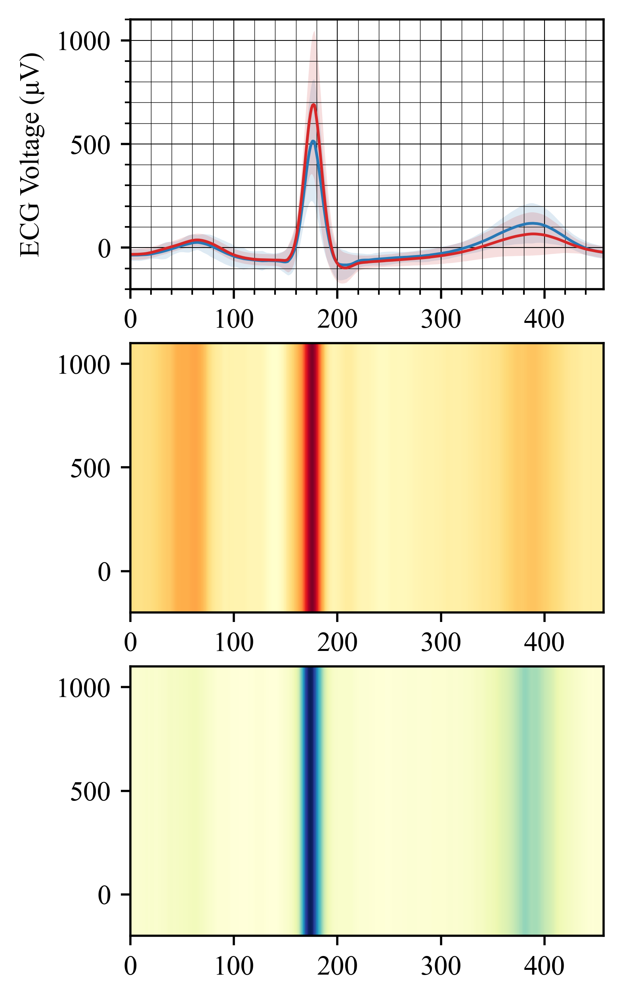

In [80]:
HTN_ECG_y_ALL = HTN_ECG_y[:,0:2,:].mean(axis=1) #N,C,L -> N,L
NHTN_ECG_y_ALL = NHTN_ECG_y[:,0:2,:].mean(axis=1) #N,C,L -> N,L
HTN_colors_z_ALL = HTN_colors_z[:,0:2,:].mean(axis=1) #N,C,L -> N,L
NHTN_colors_z_ALL = NHTN_colors_z[:,0:2,:].mean(axis=1) #N,C,L -> N,L

xticks_list = segment_index
xticks_label = ['','P','','Q','R','S','','','T','']
fig, (ax0,ax1,ax2) = plt.subplots(nrows=3, ncols=1,figsize=(8,6),dpi = 500)
t = np.arange(0,HTN_ECG_y.shape[-1]) #总步长 L 

ax0.plot(t, (NHTN_ECG_y_ALL.mean(axis = 0)),lw=1, color='#2878B5',label='NHTN ECG') 
ax0.fill_between(t, 
                (NHTN_ECG_y_ALL.mean(axis = 0))-(NHTN_ECG_y_ALL.std(axis = 0)), 
                (NHTN_ECG_y_ALL.mean(axis = 0))+(NHTN_ECG_y_ALL.std(axis = 0)),
                facecolor='#2878B5', alpha=.15, label='NHTN ECG 95% CI ')

ax0.plot(t, (HTN_ECG_y_ALL).mean(axis = 0),lw=1, color='C82423',label='HTN ECG') 
ax0.fill_between(t, 
                (HTN_ECG_y_ALL.mean(axis = 0))-(HTN_ECG_y_ALL.std(axis = 0)), 
                (HTN_ECG_y_ALL.mean(axis = 0))+(HTN_ECG_y_ALL.std(axis = 0)),
                facecolor='#C82423', alpha=.15,label='HTN ECG 95% CI ')

ax0.set_ylabel('ECG Voltage (μV)', fontdict=fontdict)
# ax0.set_xlabel('Time (ms)', fontdict=fontdict)
ax0.set_ylim(-200, +1100)
ax0.set_xlim(0, HTN_ECG_y_ALL.shape[-1])
ax0.set_aspect(0.2)#用于设置轴缩放的方面，即y-unit与x-unit的比率
ax0.xaxis.set_major_locator(plt.MultipleLocator(100))# type: ignore # 100*0.002s=0.2s = 5格
ax0.xaxis.set_minor_locator(plt.MultipleLocator(20)) # type: ignore # 20*0.002=0.004S = 1格
ax0.yaxis.set_major_locator(plt.MultipleLocator(500))# type: ignore # 0.1uv*500 = 0.5ms = 5格
ax0.yaxis.set_minor_locator(plt.MultipleLocator(100))# type: ignore # 0.1uv*100 =0.1ms = 1格 
ax0.grid(which='major', axis='x', linewidth=0.3, linestyle='-', color='k')
ax0.grid(which='minor', axis='x', linewidth=0.2, linestyle='-', color='k')
ax0.grid(which='major', axis='y', linewidth=0.3, linestyle='-', color='k')
ax0.grid(which='minor', axis='y', linewidth=0.2, linestyle='-', color='k')

# Normalize the z values to the range 0-1
z = ((HTN_colors_z_ALL).mean(axis = 0))
norm = plt.Normalize(z.min(), z.max())
# z = np.interp(z, [0, 0.3, 0.3, 1], [0, 0.3, 0.9, 1])
cmap = plt.cm.ScalarMappable(norm=norm, cmap=plt.cm.YlOrRd)
cmap.set_array([])
# Plot the vertical lines with colors from the colormap
for i in range(len(z)):
    ax1.axvline(x=i, color=cmap.to_rgba(z[i]), alpha=1)
ax1.set_ylim(-200, +1100)
ax1.set_xlim(0, HTN_ECG_y_ALL.shape[-1])
ax1.set_aspect(0.2)#用于设置轴缩放的方面，即y-unit与x-unit的比率

# Normalize the z values to the range 0-1
z = ((NHTN_colors_z_ALL).mean(axis = 0))
norm = plt.Normalize(z.min(), z.max())
# z = np.interp(z, [0, 0.3, 0.3, 1], [0, 0.3, 0.9, 1])
cmap = plt.cm.ScalarMappable(norm=norm, cmap=plt.cm.YlGnBu)
cmap.set_array([])
# Plot the vertical lines with colors from the colormap
for i in range(len(z)):
    ax2.axvline(x=i, color=cmap.to_rgba(z[i]), alpha=1)
ax2.set_ylim(-200, +1100)
ax2.set_xlim(0, HTN_ECG_y_ALL.shape[-1])
ax2.set_aspect(0.2)#用于设置轴缩放的方面，即y-unit与x-unit的比率

plt.savefig("buff.pdf", transparent=True)


In [88]:
import matplotlib.colors as colors

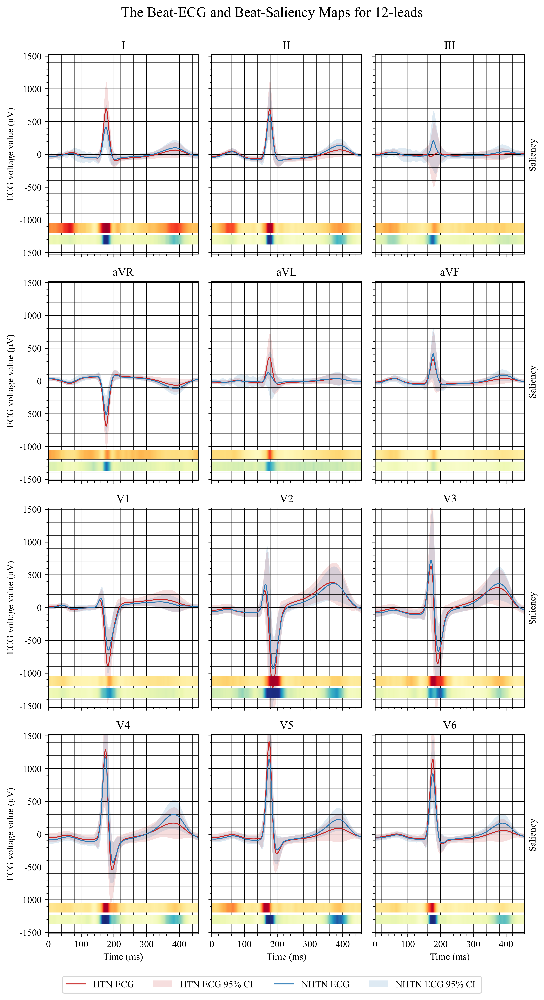

In [106]:
lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6','v7']
xticks_list = segment_index
xticks_label = ['','P','','Q','R','S','','','T','']

fig, axs = plt.subplots(nrows=4, ncols=3,figsize=(8,14),dpi = 600)
t = np.arange(0,HTN_ECG_y.shape[-1]) #总步长 L 
# HTN_colors = ECGplot.color_map(((HTN_important_values.reshape([12,-1]))), 'autumn')#相当于归一化
# NHTN_colors = ECGplot.color_map(((NHTN_important_values.reshape([12,-1]))), 'YlGnBu')#相当于归一化
for i,ax in enumerate(axs.flat):  # type: ignore
    
    ax.plot(t, (HTN_ECG_y.mean(axis = 0)[i]), lw=1,color='#C82423',label='HTN ECG')
    ax.fill_between(t, 
                    (HTN_ECG_y.mean(axis = 0)[i])-(HTN_ECG_y.std(axis = 0)[i]), 
                    (HTN_ECG_y.mean(axis = 0)[i])+(HTN_ECG_y.std(axis = 0)[i]),
                    facecolor='#C82423', alpha=0.15,label='HTN ECG 95% CI ')
    
    ax.plot(t, (NHTN_ECG_y.mean(axis = 0)[i]), lw=1,color='#2878B5',label='NHTN ECG') 
    ax.fill_between(t, 
                    (NHTN_ECG_y.mean(axis = 0)[i])-(NHTN_ECG_y.std(axis = 0)[i]), 
                    (NHTN_ECG_y.mean(axis = 0)[i])+(NHTN_ECG_y.std(axis = 0)[i]),
                    facecolor='#2878B5', alpha=0.15,label='NHTN ECG 95% CI ') 
    
    ax.set_ylim(-1900, +1900)
    ax.set_xlim(0, HTN_ECG_y.shape[-1])
    ax.set_aspect(0.2)#用于设置轴缩放的方面，即y-unit与x-unit的比率
    
    
    ax.xaxis.set_major_locator(plt.MultipleLocator(100))# type: ignore # 100*0.002s=0.2s = 5格
    ax.xaxis.set_minor_locator(plt.MultipleLocator(20)) # type: ignore # 20*0.002=0.004S = 1格
    ax.yaxis.set_major_locator(plt.MultipleLocator(500))# type: ignore # 0.1uv*500 = 0.5ms = 5格
    ax.yaxis.set_minor_locator(plt.MultipleLocator(100))# type: ignore # 0.1uv*100 =0.1ms = 1格 
    ax.grid(which='major', axis='x', linewidth=0.5, linestyle='-', color='k')
    ax.grid(which='minor', axis='x', linewidth=0.2, linestyle='-', color='k')
    ax.grid(which='major', axis='y', linewidth=0.5, linestyle='-', color='k')
    ax.grid(which='minor', axis='y', linewidth=0.2, linestyle='-', color='k')
    if(i == 0 or i == 3  or i == 6):
        ax.set_ylabel('ECG voltage value (μV)', fontdict=fontdict)
        ax.axes.xaxis.set_ticklabels([])
    elif(i == 9):
        ax.set_ylabel('ECG voltage value (μV)', fontdict=fontdict)
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
    elif(i >9):
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
        ax.axes.yaxis.set_ticklabels([])
    else:
        ax.axes.xaxis.set_ticklabels([])
        ax.axes.yaxis.set_ticklabels([])
        
    #绘制高血压的重要性图        
    ax1 = ax.twinx()
    ax1.set_ylim(-2100, +2100)
    ax1.set_aspect(0.2)#用于设置轴缩放的方面，即y-unit与x-unit的比率
    norm = plt.Normalize(HTN_colors_z.min(), HTN_colors_z.max())
    z = (HTN_colors_z.mean(axis = 0)[i])
    z = np.interp(z, [0, 0.1, 0.3, 1], [0, 0.3, 0.9, 1])
    z = np.transpose(np.tile(z, (1, 1)))
    # 绘制饱和度图像
    xmin = 0
    xmax = HTN_ECG_y.shape[-1]
    ymin = -1650
    ymax = -1450
    ax1.imshow(z.transpose(), cmap=plt.cm.YlOrRd, extent=[xmin, xmax, ymin, ymax],norm = norm) # 饱和度图像
    # fig.colorbar(ax1.images[0], ax=ax1, orientation='vertical', pad=0.1, shrink=0.5) # 颜色条
    ax1.set_aspect('auto')
    if(i == 2 or i == 5 or i == 8 or i == 11):
        ax1.set_ylabel('Saliency', fontdict=fontdict)
        ax1.yaxis.set_ticks([])
    else:
        ax1.yaxis.set_ticks([])
    # 调整ax1的位置和大小
    
    #绘制非高血压的重要性图        
    ax2 = ax.twinx()
    ax2.set_ylim(-2100, +2100)
    ax2.set_aspect(0.2)#用于设置轴缩放的方面，即y-unit与x-unit的比率
    norm = plt.Normalize(NHTN_colors_z.min(), NHTN_colors_z.max())
    z = (NHTN_colors_z.mean(axis = 0)[i])
    z = np.interp(z, [0, 0.1, 0.3, 1], [0, 0.3, 0.9, 1])
    z = np.transpose(np.tile(z, (1, 1))) #增加为一维度
    # 绘制饱和度图像
    xmin = 0
    xmax = NHTN_ECG_y.shape[-1]
    ymin = -1900
    ymax = -1700
    ax2.imshow(z.transpose(), cmap=plt.cm.YlGnBu, extent=[xmin, xmax, ymin, ymax],norm = norm) # 饱和度图像
    ax2.set_aspect('auto')
    ax2.yaxis.set_ticks([])
    # 调整ax1的位置和大小
    
    ax.set_title(lead_index[i])
    
ax.get_shared_y_axes()    
handles, labels = ax.get_legend_handles_labels()
handles1, labels1 = ax1.get_legend_handles_labels()
handles = handles+handles1
fig.legend(handles=handles,loc='upper center', bbox_to_anchor=(0.5,0),ncol=4)

# 设置大图的标题，并将y参数设为1.05，使其位于大图之外
fig.suptitle('The Beat-ECG and Beat-Saliency Maps for 12-leads', fontsize=15,y=1.0005)
fig.tight_layout()
plt.savefig("LOCATE.pdf", transparent=True)


0.125 0.7126086956521739 0.2279411764705882 0.16739130434782612
0.125 0.7126086956521739 0.2279411764705882 0.16739130434782612 

0.3985294117647059 0.7126086956521739 0.2279411764705882 0.16739130434782612
0.3985294117647059 0.7126086956521739 0.2279411764705882 0.16739130434782612 

0.6720588235294118 0.7126086956521739 0.2279411764705882 0.16739130434782612
0.6720588235294118 0.7126086956521739 0.2279411764705882 0.16739130434782612 

0.125 0.5117391304347826 0.2279411764705882 0.16739130434782612
0.125 0.5117391304347826 0.2279411764705882 0.16739130434782612 

0.3985294117647059 0.5117391304347826 0.2279411764705882 0.16739130434782612
0.3985294117647059 0.5117391304347826 0.2279411764705882 0.16739130434782612 

0.6720588235294118 0.5117391304347826 0.2279411764705882 0.16739130434782612
0.6720588235294118 0.5117391304347826 0.2279411764705882 0.16739130434782612 

0.125 0.3108695652173913 0.2279411764705882 0.16739130434782606
0.125 0.3108695652173913 0.2279411764705882 0.167391

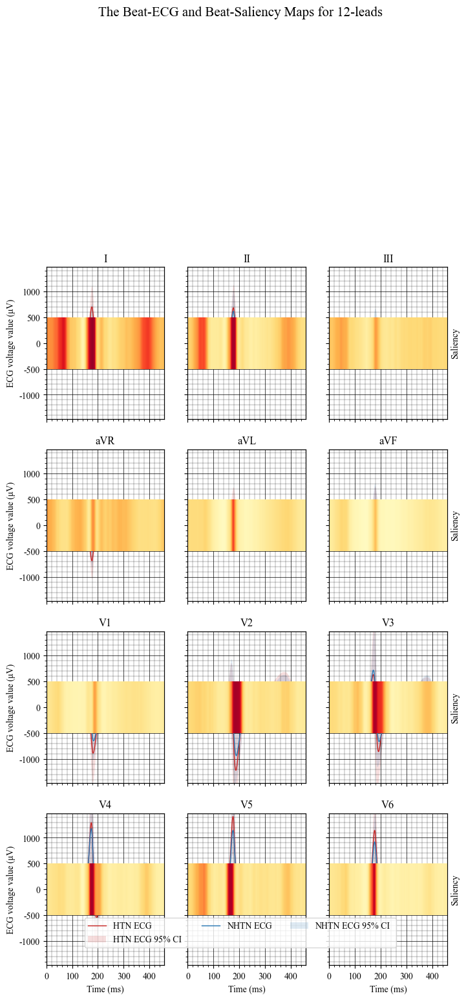

In [105]:
lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6','v7']
xticks_list = segment_index
xticks_label = ['','P','','Q','R','S','','','T','']

fig, axs = plt.subplots(nrows=4, ncols=3,figsize=(8,14),dpi = 100)
t = np.arange(0,HTN_ECG_y.shape[-1]) #总步长 L 

for i,ax in enumerate(axs.flat):  # type: ignore
    
    ax.plot(t, (HTN_ECG_y.mean(axis = 0)[i]), lw=1,color='#C82423',label='HTN ECG')
    ax.fill_between(t, 
                    (HTN_ECG_y.mean(axis = 0)[i])-(HTN_ECG_y.std(axis = 0)[i]), 
                    (HTN_ECG_y.mean(axis = 0)[i])+(HTN_ECG_y.std(axis = 0)[i]),
                    facecolor='#C82423', alpha=0.15,label='HTN ECG 95% CI ')
    
    ax.plot(t, (NHTN_ECG_y.mean(axis = 0)[i]), lw=1,color='#2878B5',label='NHTN ECG') 
    ax.fill_between(t, 
                    (NHTN_ECG_y.mean(axis = 0)[i])-(NHTN_ECG_y.std(axis = 0)[i]), 
                    (NHTN_ECG_y.mean(axis = 0)[i])+(NHTN_ECG_y.std(axis = 0)[i]),
                    facecolor='#2878B5', alpha=0.15,label='NHTN ECG 95% CI ') 
    
    ax.set_ylim(-1900, +1900)
    ax.set_xlim(0, HTN_ECG_y.shape[-1])
    ax.set_aspect(0.2)#用于设置轴缩放的方面，即y-unit与x-unit的比率
    
    
    ax.xaxis.set_major_locator(plt.MultipleLocator(100))# type: ignore # 100*0.002s=0.2s = 5格
    ax.xaxis.set_minor_locator(plt.MultipleLocator(20)) # type: ignore # 20*0.002=0.004S = 1格
    ax.yaxis.set_major_locator(plt.MultipleLocator(500))# type: ignore # 0.1uv*500 = 0.5ms = 5格
    ax.yaxis.set_minor_locator(plt.MultipleLocator(100))# type: ignore # 0.1uv*100 =0.1ms = 1格 
    ax.grid(which='major', axis='x', linewidth=0.5, linestyle='-', color='k')
    ax.grid(which='minor', axis='x', linewidth=0.2, linestyle='-', color='k')
    ax.grid(which='major', axis='y', linewidth=0.5, linestyle='-', color='k')
    ax.grid(which='minor', axis='y', linewidth=0.2, linestyle='-', color='k')
    if(i == 0 or i == 3  or i == 6):
        ax.set_ylabel('ECG voltage value (μV)', fontdict=fontdict)
        ax.axes.xaxis.set_ticklabels([])
    elif(i == 9):
        ax.set_ylabel('ECG voltage value (μV)', fontdict=fontdict)
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
    elif(i >9):
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
        ax.axes.yaxis.set_ticklabels([])
    else:
        ax.axes.xaxis.set_ticklabels([])
        ax.axes.yaxis.set_ticklabels([])
        
    #绘制高血压的重要性图        
    ax1 = ax.twinx()
    ax1.set_ylim(0, 200)
    norm = plt.Normalize(HTN_colors_z.min(), HTN_colors_z.max())
    z = (HTN_colors_z.mean(axis = 0)[i])
    z = np.interp(z, [0, 0.1, 0.3, 1], [0, 0.3, 0.9, 1])
    z = np.transpose(np.tile(z, (1, 1)))
    # 绘制饱和度图像
    xmin = 0
    xmax = HTN_ECG_y.shape[-1]
    ymin = 0
    ymax = 200
    ax1.imshow(z.transpose(), cmap=plt.cm.YlOrRd, extent=[xmin, xmax, ymin, ymax],norm = norm) # 饱和度图像
    if(i == 2 or i == 5 or i == 8 or i == 11):
        ax1.set_ylabel('Saliency', fontdict=fontdict)
        ax1.yaxis.set_ticks([])
    else:
        ax1.yaxis.set_ticks([])
    # 调整ax1的位置和大小
    box0 = ax.get_position()
    box1 = ax1.get_position()
    print(box0.x0, box0.y0, box0.width, box0.height,)
    print(box1.x0, box1.y0, box1.width, box1.height,'\n')
    ax1.set_in_layout(False)
    ax1.set_position([box0.x0, box0.y0-box1.height, box0.width, box1.height])
    
    # ax1.set_aspect('auto')
    #绘制非高血压的重要性图        
    
    
    ax.set_title(lead_index[i])
    
ax.get_shared_y_axes()    
handles, labels = ax.get_legend_handles_labels()
handles1, labels1 = ax1.get_legend_handles_labels()
handles = handles+handles1
fig.legend(handles=handles,loc='upper center', bbox_to_anchor=(0.5,0),ncol=3)

# 设置大图的标题，并将y参数设为1.05，使其位于大图之外
fig.suptitle('The Beat-ECG and Beat-Saliency Maps for 12-leads', fontsize=15,y=1.0005)
plt.savefig("LOCATE.pdf", transparent=True)


## 单独绘制某一个导联的importance

KeyboardInterrupt: 

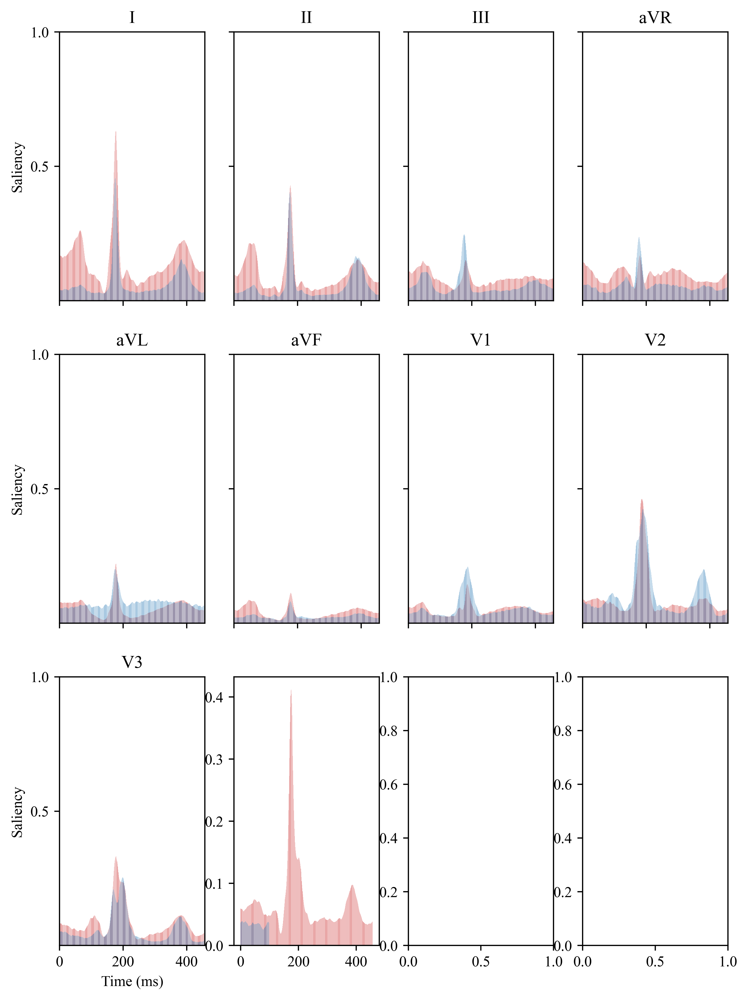

In [34]:
lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
xticks_list = segment_index
xticks_label = ['','P','','Q','R','S','','','T','']

fig, axs = plt.subplots(nrows=3, ncols=4,figsize=(8,11),dpi = 500)
t = np.arange(0,HTN_ECG_y.shape[-1]) #总步长 L 
# HTN_colors = ECGplot.color_map(((HTN_important_values.reshape([12,-1]))), 'autumn')#相当于归一化
# NHTN_colors = ECGplot.color_map(((NHTN_important_values.reshape([12,-1]))), 'YlGnBu')#相当于归一化
for i,ax in enumerate(axs.flat):  # type: ignore
    
    ax.bar(t, (HTN_colors_z.mean(axis = 0)[i]),lw=2, alpha=.4, color='#C82423',label='HTN Saliency') 
    ax.bar(t, (NHTN_colors_z.mean(axis = 0)[i]),lw=2, alpha=.4, color='#2878B5',label='NHTN Saliency') 
    ax.set_xlim(0, HTN_ECG_y.shape[-1])
    ax.yaxis.set_ticks([0.5,1.0])
    if(i == 0 or i == 4  ):
        ax.set_ylabel('Saliency', fontdict=fontdict)
        ax.axes.xaxis.set_ticklabels([])
    elif(i == 8):
        ax.set_ylabel('Saliency', fontdict=fontdict)
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
    elif(i >8):
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
        ax.axes.yaxis.set_ticklabels([])
    else:
        ax.axes.xaxis.set_ticklabels([])
        ax.axes.yaxis.set_ticklabels([])
    ax.set_title(lead_index[i])

handles, labels = ax.get_legend_handles_labels()
handles1, labels1 = ax1.get_legend_handles_labels()
handles = handles+handles1
fig.legend(handles=handles,loc='upper center', bbox_to_anchor=(0.5,0),ncol=2)
# 调整子图间距
plt.tight_layout()
# 设置大图的标题，并将y参数设为1.05，使其位于大图之外
fig.suptitle('The Beat-ECG and Beat-Saliency Maps for 12-leads', fontsize=15,y=1.0005)
fig.tight_layout()
plt.savefig("LOCATE", transparent=True)

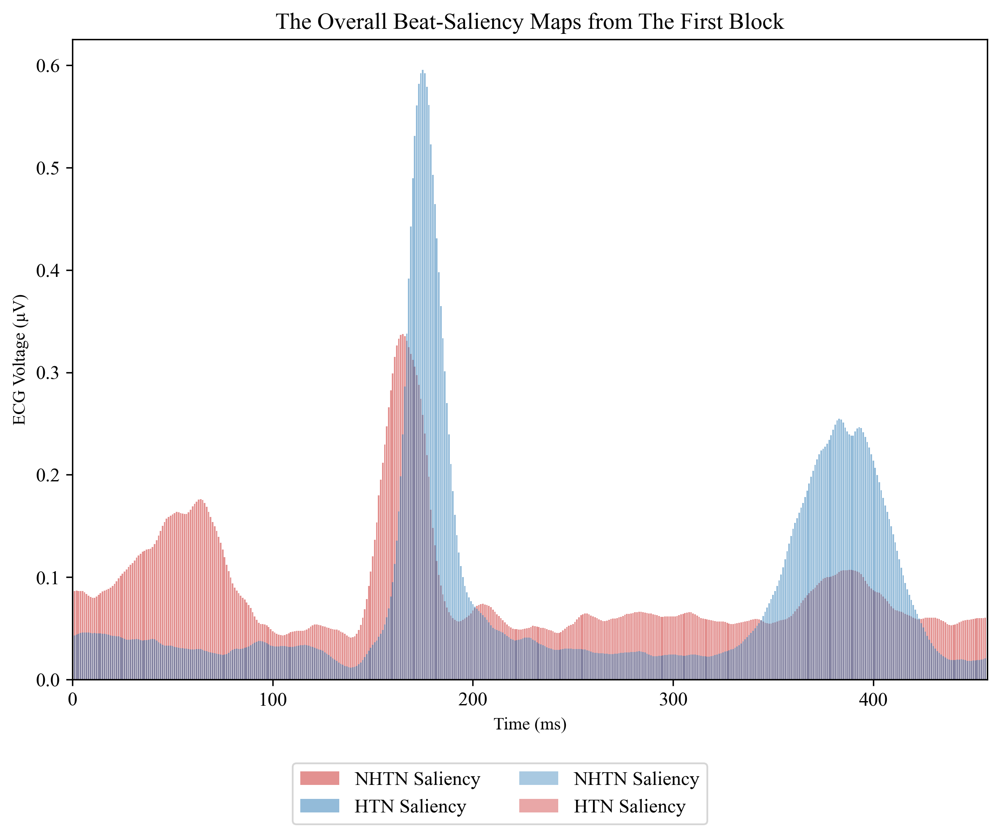

In [24]:
HTN_ECG_y_ALL = HTN_ECG_y.mean(axis=1) #N,C,L -> N,L
NHTN_ECG_y_ALL = NHTN_ECG_y.mean(axis=1) #N,C,L -> N,L
HTN_colors_z_ALL = HTN_colors_z.mean(axis=1) #N,C,L -> N,L
NHTN_colors_z_ALL = NHTN_colors_z.mean(axis=1) #N,C,L -> N,L
lead = 10

xticks_list = segment_index
xticks_label = ['','P','','Q','R','S','','','T','']
fig, axs = plt.subplots(nrows=1, ncols=1,figsize=(8,6) , dpi =300) #  

t = np.arange(0, (HTN_colors_z.mean(axis = 0)[lead]).shape[-1]) #  (L,)

axs.bar(t, ((HTN_colors_z.mean(axis = 0)[lead])),lw=1, alpha=.5, color='#C82423',label='NHTN Saliency') 
axs.bar(t, ((NHTN_colors_z.mean(axis = 0)[lead])),lw=1, alpha=.5, color='#2878B5',label='HTN Saliency') 
axs.set_ylabel('Saliency', fontdict=fontdict)
# axs.yaxis.set_ticks([0.5,1.0])

axs.set_ylabel('ECG Voltage (μV)', fontdict=fontdict)
axs.set_xlabel('Time (ms)', fontdict=fontdict)
axs.set_xlim(0, HTN_ECG_y_ALL.shape[-1])

plt.title('The Overall Beat-Saliency Maps from The First Block')
handles, labels = axs.get_legend_handles_labels()
handles1, labels1 = ax1.get_legend_handles_labels()
handles = handles+handles1
fig.legend(handles=handles,loc='upper center', bbox_to_anchor=(0.5,0),ncol=2)
plt.tight_layout()

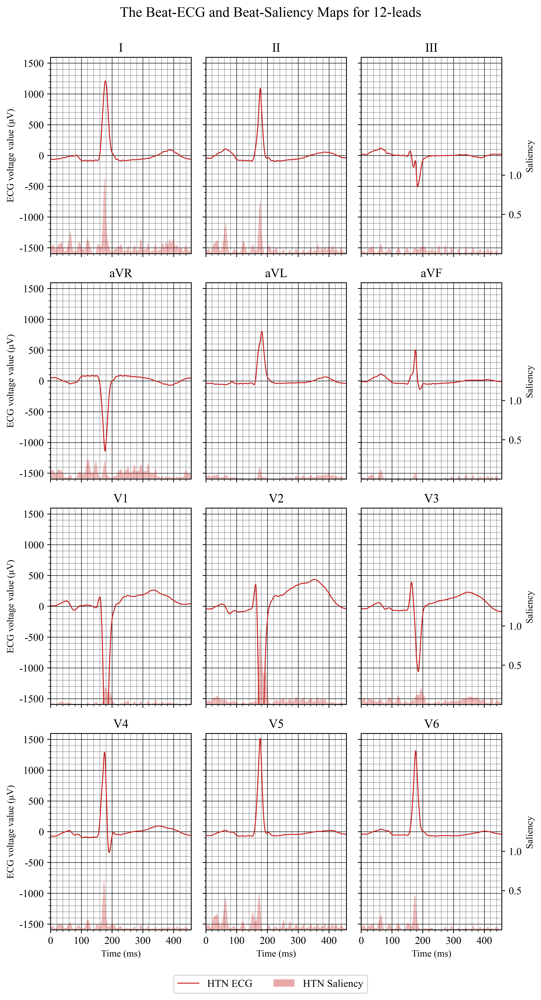

In [25]:
lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
xticks_list = segment_index
xticks_label = ['','P','','Q','R','S','','','T','']
patiens = 26#26
fig, axs = plt.subplots(nrows=4, ncols=3,figsize=(8,14),dpi = 500)
t = np.arange(0,HTN_ECG_y.shape[-1]) #总步长 L 
# HTN_colors = ECGplot.color_map(((HTN_important_values.reshape([12,-1]))), 'autumn')#相当于归一化
# NHTN_colors = ECGplot.color_map(((NHTN_important_values.reshape([12,-1]))), 'YlGnBu')#相当于归一化
for i,ax in enumerate(axs.flat):  # type: ignore
    
    ax.plot(t, (HTN_ECG_y[patiens][i]), lw=1,color='#C82423',label='HTN ECG')
    ax.set_ylim(-1900, +1900)
    ax.set_xlim(0, HTN_ECG_y.shape[-1])
    ax.set_aspect(0.2)#用于设置轴缩放的方面，即y-unit与x-unit的比率
    
    
    ax.xaxis.set_major_locator(plt.MultipleLocator(100))# type: ignore # 100*0.002s=0.2s = 5格
    ax.xaxis.set_minor_locator(plt.MultipleLocator(20)) # type: ignore # 20*0.002=0.004S = 1格
    ax.yaxis.set_major_locator(plt.MultipleLocator(500))# type: ignore # 0.1uv*500 = 0.5ms = 5格
    ax.yaxis.set_minor_locator(plt.MultipleLocator(100))# type: ignore # 0.1uv*100 =0.1ms = 1格 
    ax.grid(which='major', axis='x', linewidth=0.5, linestyle='-', color='k')
    ax.grid(which='minor', axis='x', linewidth=0.2, linestyle='-', color='k')
    ax.grid(which='major', axis='y', linewidth=0.5, linestyle='-', color='k')
    ax.grid(which='minor', axis='y', linewidth=0.2, linestyle='-', color='k')
    if(i == 0 or i == 3  or i == 6):
        ax.set_ylabel('ECG voltage value (μV)', fontdict=fontdict)
        ax.axes.xaxis.set_ticklabels([])
    elif(i == 9):
        ax.set_ylabel('ECG voltage value (μV)', fontdict=fontdict)
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
    elif(i >9):
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
        ax.axes.yaxis.set_ticklabels([])
    else:
        ax.axes.xaxis.set_ticklabels([])
        ax.axes.yaxis.set_ticklabels([])
    ax1 = ax.twinx()
    ax1.bar(t, (HTN_colors_z[patiens][i]),lw=2, alpha=.4, color='#C82423',label='HTN Saliency') 
    
    ax1.set_ylim(0., 2.5)
    if(i == 2 or i == 5 or i == 8 or i == 11):
        ax1.set_ylabel('Saliency', fontdict=fontdict)
        ax1.yaxis.set_ticks([0.5,1.0])
    else:
        ax1.yaxis.set_ticks([])
    
    
    # plt.title('ECG and Saliency for Beat')
    # axs.legend(loc="upper left")
    # ax1.legend(loc="best")
    # for j in range(len(xticks_label)):
    #     if(xticks_label[j] == ''): continue
    #     ax.axvline(x=int(xticks_list[j]),ls=':',lw=0.5,color='k')
        
    # ax.set_xticks(xticks_list) # 设置刻度
    # ax.set_xticklabels(xticks_label)
    
    ax.set_title(lead_index[i])
    
ax.get_shared_y_axes()    

handles, labels = ax.get_legend_handles_labels()
handles1, labels1 = ax1.get_legend_handles_labels()
handles = handles+handles1
fig.legend(handles=handles,loc='upper center', bbox_to_anchor=(0.5,0),ncol=3)
# 调整子图间距
plt.tight_layout()
# 设置大图的标题，并将y参数设为1.05，使其位于大图之外
fig.suptitle('The Beat-ECG and Beat-Saliency Maps for 12-leads', fontsize=15,y=1.0005)
fig.tight_layout()
plt.savefig("The Beat-ECG and Beat-Saliency Maps for 12-leads 70-80.pdf", transparent=True)


## show just P wave

In [44]:
waves_location_file_root = '/workspace/data/Preprocess_HTN/datas_/Wave/'
select_list =['P_start', 'P_peak','Q_start', 'Q_peak' ]
segement_num = 100 # 共select_list-1个片段，每段划分成100份
important_values = np.zeros([C1[1][1],len(select_list)-1,12,segement_num]) #278 是已知的分对的HTN的数量，为了统计std临时加的
ECG_values = np.zeros([C1[1][1],len(select_list)-1,12,segement_num])

sample_count = 0
for index in range(test_dataset.__len__()):#test_dataset.__len__()
   
    important_value = np.zeros([len(select_list)-1,12,segement_num])
    ECG_value = np.zeros([len(select_list)-1,12,segement_num])
    
    info =test_dataset.infos.iloc[index]
    ECG,labels = test_dataset.__getitem__(index)
    ECG = ECG*5000 #恢复
    ECG_dignose_isoline = isoline_correction(np.array(ECG))
    if(labels != y_true[index]): 
        break
    pred = y_pred[index]
    if(((pred == labels) and (pred == 1))): 
        
        ECGfile_name = info['ECGFilename']
        layervalue_file = layervalue_root  + ECGfile_name +'.npy'
        waves = np.load(waves_location_file_root+'/FPT/'+ECGfile_name+'.npy')
        layervalue = np.load(layervalue_file)
        waves_ = pd.DataFrame(waves[1:-1],columns=['P_start', 'P_peak', 'P_end','Q_start', 'Q_peak', 'R_peak', 'S_peak', 'S_end','J','T_start', 'T_peak', 'T_end','res0'])
        waves = waves_[select_list].copy()
        if(waves.isnull().any().any()):
            continue
        for bet in range(len(waves.index)):
            
            for peak in range(len(waves.columns)-1):
                start = int(waves.loc[bet][peak])
                end = int(waves.loc[bet][peak+1])
                if (start >= end): continue
                important_value[peak] = important_value[peak] + leads_layervalue_segement_count_upsample(start,end,layervalue,segement_num)
                ECG_value[peak] = ECG_value[peak]+ leads_layervalue_segement_count_upsample(start,end,ECG_dignose_isoline,segement_num)
                
        ECG_value = ECG_value/len(waves.index)#按心拍数平均一下 
        ECG_value = ECG_value - np.concatenate((np.concatenate(((ECG_value[0,:,0]).reshape([1,12,-1]),(ECG_value[0,:,0]).reshape([1,12,-1])),axis=0),(ECG_value[0,:,0]).reshape([1,12,-1])),axis=0) #根据第一个对齐(即p波起点)
        # ECG_value_leads_max = ECG_value.swapaxes(0,1).reshape([12,-1]).max(1).reshape([12,1]) #每个导联归一化
        # ECG_value_leads_min = ECG_value.swapaxes(0,1).reshape([12,-1]).min(1).reshape([12,1])
        # ECG_value = ((ECG_value.swapaxes(0,1).reshape([12,-1])-ECG_value_leads_min)/(ECG_value_leads_max-ECG_value_leads_min)).reshape([12,len(select_list)-1,segement_num]).swapaxes(0,1)
        # ECG_values = ECG_values +ECG_value
        ECG_values[sample_count] = ECG_value
        important_value = important_value/len(waves.index)#按心拍数平均一下
        # important_value_leads_max = important_value.swapaxes(0,1).reshape([12,-1]).max(1).reshape([12,1])#每个导联归一化
        # important_value_leads_min = important_value.swapaxes(0,1).reshape([12,-1]).min(1).reshape([12,1])
        # important_value = ((important_value.swapaxes(0,1).reshape([12,-1])-important_value_leads_min)/(important_value_leads_max-important_value_leads_min)).reshape([12,len(select_list)-1,segement_num]).swapaxes(0,1)
        important_value = max_min(important_value)
        # important_values = important_values + important_value
        important_values[sample_count] = important_value
        sample_count = sample_count +1
HTN_important_values = important_values #按样本数平均一下
HTN_ECG_values = ECG_values
print(sample_count)

1149


In [45]:
ECG_value.shape

(3, 12, 100)

In [46]:
waves_location_file_root = '/workspace/data/Preprocess_HTN/datas_/Wave/'
segement_num = 100 # 共select_list-1个片段，每段划分成100份
important_values = np.zeros([C1[0][0],len(select_list)-1,12,segement_num]) #278 是已知的分对的HTN的数量，为了统计std临时加的
ECG_values = np.zeros([C1[0][0],len(select_list)-1,12,segement_num])

sample_count = 0
for index in range(test_dataset.__len__()):#test_dataset.__len__()
   
    important_value = np.zeros([len(select_list)-1,12,segement_num])
    ECG_value = np.zeros([len(select_list)-1,12,segement_num])
    
    info =test_dataset.infos.iloc[index]
    ECG,labels = test_dataset.__getitem__(index)
    ECG = ECG*5000 #恢复
    ECG_dignose_isoline = isoline_correction(np.array(ECG))
    if(labels != y_true[index]): 
        break
    pred = y_pred[index]
    if(((pred == labels) and (pred == 0))): 
        
        ECGfile_name = info['ECGFilename']
        layervalue_file = layervalue_root  + ECGfile_name +'.npy'
        waves = np.load(waves_location_file_root+'/FPT/'+ECGfile_name+'.npy')
        layervalue = np.load(layervalue_file)
        waves_ = pd.DataFrame(waves[1:-1],columns=['P_start', 'P_peak', 'P_end','Q_start', 'Q_peak', 'R_peak', 'S_peak', 'S_end','J','T_start', 'T_peak', 'T_end','res0'])
        waves = waves_[select_list].copy()
        if(waves.isnull().any().any()):
            continue
        for bet in range(len(waves.index)):
            
            for peak in range(len(waves.columns)-1):
                start = int(waves.loc[bet][peak])
                end = int(waves.loc[bet][peak+1])
                if (start >= end): continue
                important_value[peak] = important_value[peak] + leads_layervalue_segement_count_upsample(start,end,layervalue,segement_num)
                ECG_value[peak] = ECG_value[peak]+ leads_layervalue_segement_count_upsample(start,end,ECG_dignose_isoline,segement_num)
                
        ECG_value = ECG_value/len(waves.index)#按心拍数平均一下 
        ECG_value = ECG_value - np.concatenate((np.concatenate(((ECG_value[0,:,0]).reshape([1,12,-1]),(ECG_value[0,:,0]).reshape([1,12,-1])),axis=0),(ECG_value[0,:,0]).reshape([1,12,-1])),axis=0) #根据第一个对齐(即p波起点) #根据第一个对齐(即p波起点)
        # ECG_value_leads_max = ECG_value.swapaxes(0,1).reshape([12,-1]).max(1).reshape([12,1]) #每个导联归一化
        # ECG_value_leads_min = ECG_value.swapaxes(0,1).reshape([12,-1]).min(1).reshape([12,1])
        # ECG_value = ((ECG_value.swapaxes(0,1).reshape([12,-1])-ECG_value_leads_min)/(ECG_value_leads_max-ECG_value_leads_min)).reshape([12,len(select_list)-1,segement_num]).swapaxes(0,1)
        # ECG_values = ECG_values +ECG_value
        ECG_values[sample_count] = ECG_value
        important_value = important_value/len(waves.index)#按心拍数平均一下
        # important_value_leads_max = important_value.swapaxes(0,1).reshape([12,-1]).max(1).reshape([12,1])#每个导联归一化
        # important_value_leads_min = important_value.swapaxes(0,1).reshape([12,-1]).min(1).reshape([12,1])
        # important_value = ((important_value.swapaxes(0,1).reshape([12,-1])-important_value_leads_min)/(important_value_leads_max-important_value_leads_min)).reshape([12,len(select_list)-1,segement_num]).swapaxes(0,1)
        important_value = max_min(important_value)
        # important_values = important_values + important_value
        important_values[sample_count] = important_value
        sample_count = sample_count +1
NHTN_important_values = important_values #按样本数平均一下
NHTN_ECG_values = ECG_values
print(sample_count)

10923


### 查看有多少样本的P波重要度高于99%的样本

In [43]:
waves_location_file_root = '/workspace/data/Preprocess_HTN/datas_/Wave/'
select_list =['P_start', 'P_peak','P_end', 'Q_peak' ]
segement_num = 100 # 共select_list-1个片段，每段划分成100份
important_values = np.zeros([C1[1][1],len(select_list)-1,12,segement_num]) #278 是已知的分对的HTN的数量，为了统计std临时加的
ECG_values = np.zeros([C1[1][1],len(select_list)-1,12,segement_num])
P_is_importanced_ID_list = []
sample_count = 0
for index in range(test_dataset.__len__()):#test_dataset.__len__()
   
    important_value = np.zeros([len(select_list)-1,12,segement_num])
    ECG_value = np.zeros([len(select_list)-1,12,segement_num])
    
    info =test_dataset.infos.iloc[index]
    ECG,labels = test_dataset.__getitem__(index)
    ECG = ECG*5000 #恢复
    ECG_dignose_isoline = isoline_correction(np.array(ECG))
    if(labels != y_true[index]): 
        break
    pred = y_pred[index]
    if(((pred == labels) and (pred == 1))): 
        
        ECGfile_name = info['ECGFilename']
        layervalue_file = layervalue_root  + ECGfile_name +'.npy'
        waves = np.load(waves_location_file_root+'/FPT/'+ECGfile_name+'.npy')
        layervalue = np.load(layervalue_file)
        waves_ = pd.DataFrame(waves[1:-1],columns=['P_start', 'P_peak', 'P_end','Q_start', 'Q_peak', 'R_peak', 'S_peak', 'S_end','J','T_start', 'T_peak', 'T_end','res0'])
        waves = waves_[select_list].copy()
        if(waves.isnull().any().any()):
            continue
        TH = np.percentile(layervalue, (99), interpolation='midpoint')
        P_is_importance = False
        for bet in range(len(waves.index)):
            start_p = int(waves.loc[bet][0])#P_start
            end_p = int(waves.loc[bet][2])#P_end
            
            if(np.any((layervalue[:,start_p:end_p])>=TH)): #在P波范围内的重要值有大于全局重要值的75%的？
                P_is_importance = True
                P_is_importanced_ID_list.append(info['ID'])
            else:
                continue   
        if(P_is_importance):
            for bet in range(len(waves.index)):
                for peak in range(len(waves.columns)-1):
                        start = int(waves.loc[bet][peak])
                        end = int(waves.loc[bet][peak+1])
                        
                        if (start >= end): continue
                        important_value[peak] = important_value[peak] + leads_layervalue_segement_count_upsample(start,end,layervalue,segement_num)
                        ECG_value[peak] = ECG_value[peak]+ leads_layervalue_segement_count_upsample(start,end,ECG_dignose_isoline,segement_num)
        
            ECG_value = ECG_value/len(waves.index)#按心拍数平均一下 
            ECG_value = ECG_value - np.concatenate((np.concatenate(((ECG_value[0,:,0]).reshape([1,12,-1]),(ECG_value[0,:,0]).reshape([1,12,-1])),axis=0),(ECG_value[0,:,0]).reshape([1,12,-1])),axis=0) #根据第一个对齐(即p波起点)
            # ECG_value_leads_max = ECG_value.swapaxes(0,1).reshape([12,-1]).max(1).reshape([12,1]) #每个导联归一化
            # ECG_value_leads_min = ECG_value.swapaxes(0,1).reshape([12,-1]).min(1).reshape([12,1])
            # ECG_value = ((ECG_value.swapaxes(0,1).reshape([12,-1])-ECG_value_leads_min)/(ECG_value_leads_max-ECG_value_leads_min)).reshape([12,len(select_list)-1,segement_num]).swapaxes(0,1)
            # ECG_values = ECG_values +ECG_value
            ECG_values[sample_count] = ECG_value
            important_value = important_value/len(waves.index)#按心拍数平均一下
            # important_value_leads_max = important_value.swapaxes(0,1).reshape([12,-1]).max(1).reshape([12,1])#每个导联归一化
            # important_value_leads_min = important_value.swapaxes(0,1).reshape([12,-1]).min(1).reshape([12,1])
            # important_value = ((important_value.swapaxes(0,1).reshape([12,-1])-important_value_leads_min)/(important_value_leads_max-important_value_leads_min)).reshape([12,len(select_list)-1,segement_num]).swapaxes(0,1)
            important_value = max_min(important_value)
            # important_values = important_values + important_value
            important_values[sample_count] = important_value
            sample_count = sample_count +1
HTN_important_values = important_values #按样本数平均一下
HTN_ECG_values = ECG_values
print(sample_count)

/tmp/ipykernel_5614/3262371585.py:30: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  TH = np.percentile(layervalue, (99), interpolation='midpoint')


264


In [44]:
HTN_important_values.shape

(264, 3, 12, 100)

### 压缩P波长度

In [47]:
interval_values = np.zeros([len(select_list)-1]) #

sample_count = 0
for index in tqdm(range(test_dataset.__len__())):#test_dataset.__len__()
   
    interval_value = np.zeros([len(select_list)-1])

    
    info =test_dataset.infos.iloc[index]
    ECG,labels = test_dataset.__getitem__(index)
    ECG_dignose_isoline = isoline_correction(np.array(ECG))
    if(labels != y_true[index]): 
        break
    pred = y_pred[index]
    if(((pred == labels))): 
        
        ECGfile_name = info['ECGFilename']
        waves = np.load(waves_location_file_root+'/FPT/'+ECGfile_name+'.npy')
        waves_ = pd.DataFrame(waves[1:-1],columns=['P_start', 'P_peak', 'P_end','Q_start', 'Q_peak', 'R_peak', 'S_peak', 'S_end','J','T_start', 'T_peak', 'T_end','res0'])
        waves = waves_[select_list].copy()
        if(waves.isnull().any().any()):
            continue
        for bet in range(len(waves.index)):
            for peak in range(len(waves.columns)-1):
                start = int(waves.loc[bet][peak])
                end = int(waves.loc[bet][peak+1])
                if (start >= end): continue
                interval_value[peak] = interval_value[peak]+ end-start
        interval_value = interval_value/len(waves.index)#按心拍数平均一下 
        interval_values = interval_values + interval_value
        sample_count = sample_count +1
interval_rate = (interval_values)/(interval_values.max()) #片段长度与最大值之比
print(interval_rate)

100%|██████████| 13853/13853 [17:26<00:00, 13.23it/s]

[0.93361455 1.         0.30794694]


In [48]:
HTN_colors_z,segment_index = scaled_sequen_lenth_by_interval_rate(HTN_important_values,interval_rate)
NHTN_colors_z,segment_index =scaled_sequen_lenth_by_interval_rate(NHTN_important_values,interval_rate)
HTN_ECG_y,segment_index = scaled_sequen_lenth_by_interval_rate(HTN_ECG_values,interval_rate)
NHTN_ECG_y,segment_index =scaled_sequen_lenth_by_interval_rate(NHTN_ECG_values,interval_rate)

In [49]:
HTN_colors_z.shape

(1149, 12, 223)

/tmp/ipykernel_8565/1483051061.py:55: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


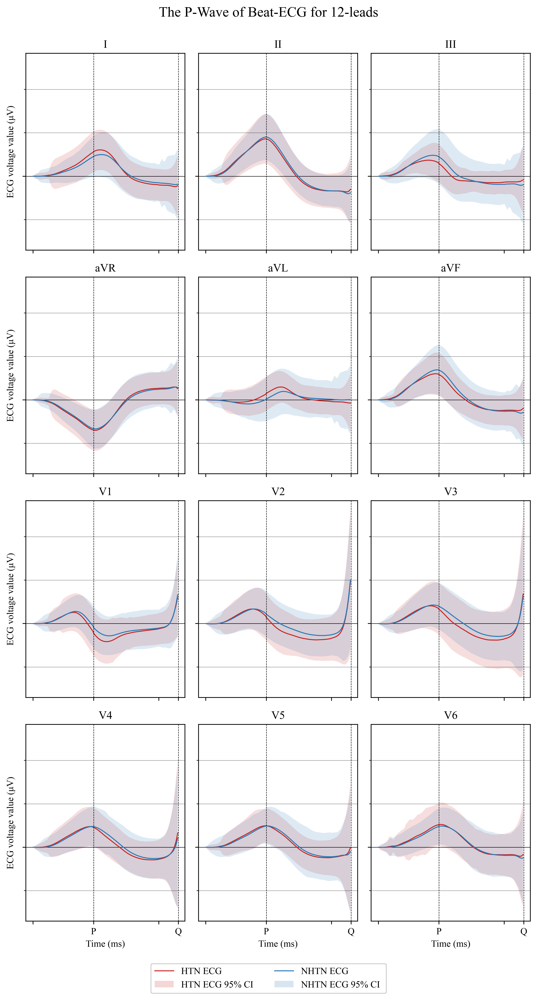

In [50]:
lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
xticks_list = segment_index
xticks_label = ['', 'P','', 'Q',  ]

fig, axs = plt.subplots(nrows=4, ncols=3,figsize=(8,14),sharey=True, constrained_layout=True,dpi =500)
t = np.arange(0,HTN_ECG_y.shape[-1]) #总步长 L 
# HTN_colors = ECGplot.color_map(((HTN_important_values.reshape([12,-1]))), 'autumn')#相当于归一化
# NHTN_colors = ECGplot.color_map(((NHTN_important_values.reshape([12,-1]))), 'YlGnBu')#相当于归一化
for i,ax in enumerate(axs.flat):  # type: ignore
    ax.plot(t, (HTN_ECG_y.mean(axis = 0)[i]), lw=1,color='#C82423',label='HTN ECG')
    ax.fill_between(t, 
                    (HTN_ECG_y.mean(axis = 0)[i])-(HTN_ECG_y.std(axis = 0)[i]), 
                    (HTN_ECG_y.mean(axis = 0)[i])+(HTN_ECG_y.std(axis = 0)[i]),
                    facecolor='#C82423', alpha=0.15,label='HTN ECG 95% CI ')
    ax.plot(t, (NHTN_ECG_y.mean(axis = 0)[i]), lw=1,color='#2878B5',label='NHTN ECG') 
    ax.fill_between(t, 
                    (NHTN_ECG_y.mean(axis = 0)[i])-(NHTN_ECG_y.std(axis = 0)[i]), 
                    (NHTN_ECG_y.mean(axis = 0)[i])+(NHTN_ECG_y.std(axis = 0)[i]),
                    facecolor='#2878B5', alpha=0.15,label='NHTN ECG 95% CI ')    
    for j in range(len(xticks_label)):
        if(xticks_label[j] == ''): continue
        ax.axvline(x=int(xticks_list[j]),ls='dashed',lw=0.5,color='k')
    
    ax.set_xticks(xticks_list) # 设置刻度
    ax.set_xticklabels(xticks_label)
    ax.set_title(lead_index[i])
    
    # ax.xaxis.set_major_locator(plt.MultipleLocator(100))# type: ignore # 100*0.002s=0.2s = 5格
    # ax.xaxis.set_minor_locator(plt.MultipleLocator(20)) # type: ignore # 20*0.002=0.004S = 1格
    ax.yaxis.set_major_locator(plt.MultipleLocator(500))# type: ignore # 0.1uv*500 = 0.5ms = 5格
    ax.yaxis.set_minor_locator(plt.MultipleLocator(100))# type: ignore # 0.1uv*100 =0.1ms = 1格 
    # ax.grid(which='major', axis='x', linewidth=0.5, linestyle='-', color='k')
    # ax.grid(which='minor', axis='x', linewidth=0.2, linestyle='-', color='k')
    ax.grid(which='major', axis='y', linewidth=0.5, linestyle='-', color='k')
    ax.grid(which='minor', axis='y', linewidth=0.2, linestyle='-', color='k')
    ax.get_shared_y_axes()    

    if(i == 0 or i == 3 or i == 6  ):
        ax.set_ylabel('ECG voltage value (μV)', fontdict=fontdict)
        ax.axes.xaxis.set_ticklabels([])
    elif(i == 9):
        ax.set_ylabel('ECG voltage value (μV)', fontdict=fontdict)
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
    elif(i >9):
        ax.set_xlabel('Time (ms)', fontdict=fontdict)
        ax.axes.yaxis.set_ticklabels([])
    else:
        ax.axes.xaxis.set_ticklabels([])
        ax.axes.yaxis.set_ticklabels([])


    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles=handles,loc='upper center', bbox_to_anchor=(0.5,0),ncol=2)
    # 调整子图间距
    plt.tight_layout()
    # 设置大图的标题，并将y参数设为1.05，使其位于大图之外
    fig.suptitle('The P-Wave of Beat-ECG for 12-leads', fontsize=15,y=1.00005)
    fig.tight_layout()
    plt.savefig("The P-Wave of Beat-ECG for 12-leads.pdf", transparent=True)

In [ ]:
HTN_ECG_y.mean(axis = 0).shape

findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times Ne

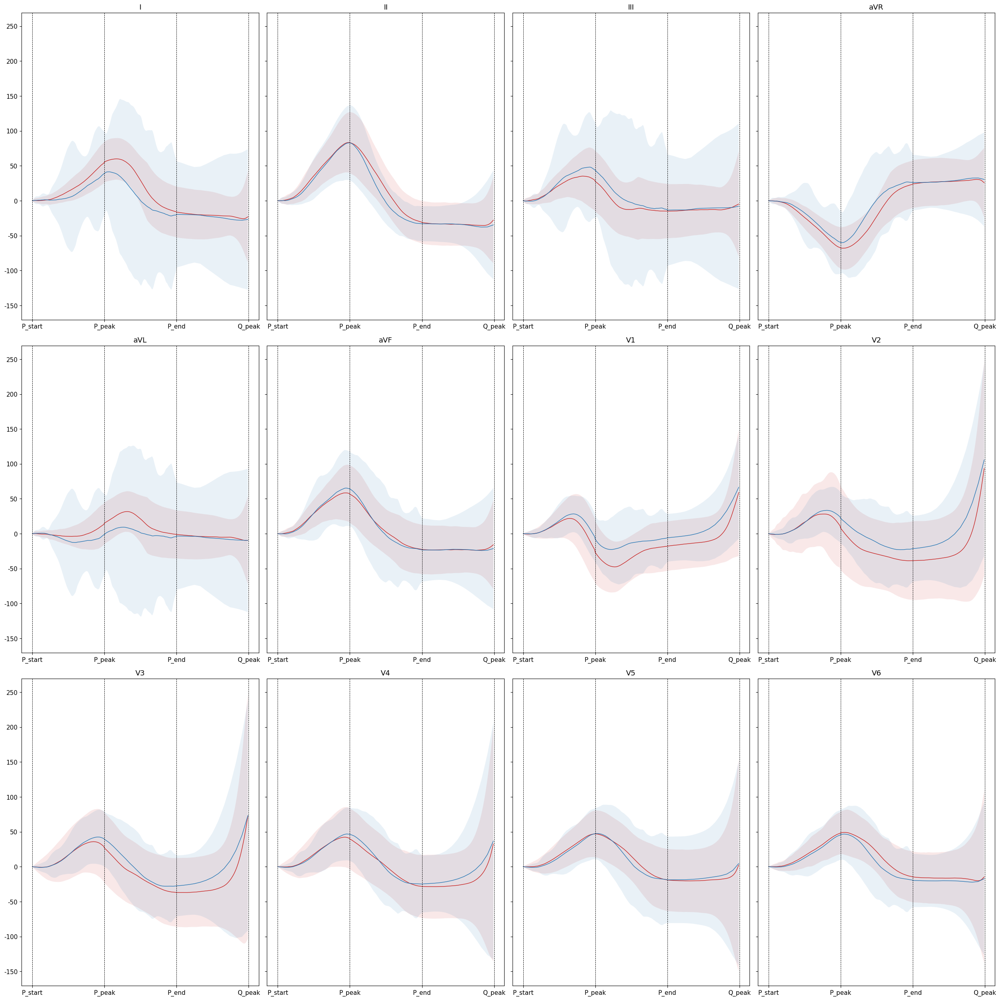

In [49]:
lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
xticks_list = list(np.arange(0,len(select_list)*segement_num,segement_num))

fig, axs = plt.subplots(nrows=3, ncols=4,sharey=True,figsize=(25,25), constrained_layout=True,dpi =100)

for i,ax in enumerate(axs.flat):  # type: ignore
    HTN_plot_y = np.array(HTN_ECG_values[:,:,i,:].reshape(HTN_ECG_values.shape[0],-1)) #(N,len(xticks_list)*L)
    HTN_colors_z = np.array(HTN_important_values[:,:,i,:].reshape(HTN_ECG_values.shape[0],-1))#(N,len(xticks_list)*L)
    NHTN_plot_y = np.array(NHTN_ECG_values[:,:,i,:].reshape(NHTN_ECG_values.shape[0],-1))#(N,len(xticks_list)*L)
    NHTN_colors_z = np.array(NHTN_important_values[:,:,i,:].reshape(NHTN_ECG_values.shape[0],-1)) #(N,len(xticks_list)*L)
    t = np.arange(0,HTN_plot_y.shape[1]) # #(len(xticks_list)*L,1) 
    ax.plot(t, (HTN_plot_y.mean(axis = 0)), lw=1,color='#C82423')
    ax.fill_between(t, 
                    (HTN_plot_y.mean(axis = 0))-(HTN_plot_y.std(axis = 0)), 
                    (HTN_plot_y.mean(axis = 0))+(HTN_plot_y.std(axis = 0)),
                    facecolor='#C82423', alpha=0.1)
    ax.plot(t, (NHTN_plot_y.mean(axis = 0)), lw=1,color='#2878B5') 
    ax.fill_between(t, 
                    (NHTN_plot_y.mean(axis = 0))-(NHTN_plot_y.std(axis = 0)), 
                    (NHTN_plot_y.mean(axis = 0))+(NHTN_plot_y.std(axis = 0)),
                    facecolor='#2878B5', alpha=0.1) 
    
    
    for j in range(len(select_list)):
        ax.axvline(x=int(xticks_list[j]),ls='dashed',lw=0.7,color='k')
        
    ax.set_xticks(xticks_list) # 设置刻度
    ax.set_xticklabels(select_list)
    ax.set_title(lead_index[i])

## 绘制单个指定ID样本的ECG和layerattention值

In [7]:
# 定义获取梯度的函数
fmap_block = list()
grad_block = list()

# 获取反向的传播图
def backward_hook(module, grad_in, grad_out):
    # print('backward_hook ',len(grad_out),grad_out[0].shape)
    grad_block.append(grad_out[0].clone().cpu().detach())

# 定义获取特征图的函数
def farward_hook(module, input, output):
    # print('farward_hook ',output.shape)
    fmap_block.append(output.clone().cpu().detach())

In [8]:
def scaled_layer_cam_max(cam):
    (cam_min, cam_max) = (cam.min(), cam.max())
    norm_cam = (cam - cam_min) / (((cam_max - cam_min) + 1e-08))
    return norm_cam
def scaled_layer_cam_tanh(cam,gamma = 2.):
    (cam_min, cam_max) = (cam.min(), cam.max())
    norm_cam = np.tanh(gamma*cam/cam_max)
    return norm_cam

In [ ]:
ID = '327715'

save_root = Models_path[:-3]+'/'
layervalue_root = save_root+'/layervalue/'

if(not(os.path.exists(save_root))): os.mkdir(save_root)
if(not(os.path.exists(layervalue_root))): os.mkdir(layervalue_root)
lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
x_index = np.arange(0,12)
# fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True,sharey=True,figsize=(45,25), constrained_layout=True,dpi =100)
for index in tqdm(range( test_dataset.__len__())):# test_dataset.__len__()
    

    inputs,labels = test_dataset.__getitem__(index)
    info =test_dataset.infos.iloc[index]
    ECGfile_name = info['ECGFilename']
    ECG_ID = info['ID']
    if(ECG_ID != ID):
        continue
    else:
        NET = [Net.MLBFNet_GUR_o(True,True,True,2,Dropout_rate=0.3), ] # type: ignore
        testmodel = NET[0].to(DEVICE)
        testmodel.load_state_dict(torch.load(Models_path))
        testmodel.conv1.register_forward_hook(farward_hook)	#正向传播
        testmodel.conv1.register_full_backward_hook(backward_hook)#反向传播
        testmodel.conv2.register_forward_hook(farward_hook)	#正向传播
        testmodel.conv2.register_full_backward_hook(backward_hook)#反向传播
        testmodel.layers_list_2d[0].register_forward_hook(farward_hook)	#正向传播
        testmodel.layers_list_2d[0].register_full_backward_hook(backward_hook)#反向传播
        testmodel.layers_list_2d[1].register_forward_hook(farward_hook)	#正向传播
        testmodel.layers_list_2d[1].register_full_backward_hook(backward_hook)#反向传播
        testmodel.layers_list_2d[2].register_forward_hook(farward_hook)	#正向传播
        testmodel.layers_list_2d[2].register_full_backward_hook(backward_hook)#反向传播



        
        testmodel.eval()
        fmap_block = list()
        grad_block = list()

        labels = labels.unsqueeze(0) # 在首位添加1维作为batchsize
        inputs = inputs.unsqueeze(0) # 在首位添加1维作为batchsize

        inputs = inputs.to(DEVICE)
        labels = labels.to(DEVICE)  

        outputs = testmodel(inputs)
        # print('outputs',outputs)
        _,pred = outputs.max(1)     # 求概率最大值对应的标签
        possibility = nn.functional.softmax(outputs,dim=-1)
        # print("labels: {}".format(labels))
        # print("predict: {}".format(pred))
        # print("possibility: {}".format(possibility))
        loss = outputs[0,pred]      # 网络对应于pred的类别的输出即为loss
        loss.backward(retain_graph=True)  #retain_graph=True，目的为是为保留该过程中计算的梯度，后续G网络更新时使用

        fmap1 = (fmap_block[0][0]).to('cpu').detach().numpy()
        gradmap1 = (grad_block[4][0]).to('cpu').detach().numpy()#G是从后往前的，conv1的在后面
        layer2d_vlue1 = cam.caculate_layer_cam_vlue_2d(fmap1,gradmap1,scale_tanh = True)# scale_tanh = True

        fmap2 = (fmap_block[1][0]).to('cpu').detach().numpy()
        gradmap2 = (grad_block[3][0]).to('cpu').detach().numpy()
        layer2d_vlue2 = cam.caculate_layer_cam_vlue_2d(fmap2,gradmap2,scale_tanh = True)

        fmap2d_1 = (fmap_block[2][0]).to('cpu').detach().numpy()
        gradmap2d_1 = (grad_block[2][0]).to('cpu').detach().numpy()
        layer2d_vlue2d_1 = cam.caculate_layer_cam_vlue_2d(fmap2d_1,gradmap2d_1)

        fmap2d_2 = (fmap_block[3][0]).to('cpu').detach().numpy()
        gradmap2d_2 = (grad_block[1][0]).to('cpu').detach().numpy()
        layer2d_vlue2d_2 = cam.caculate_layer_cam_vlue_2d(fmap2d_2,gradmap2d_2)

        fmap2d_3 = (fmap_block[4][0]).to('cpu').detach().numpy()
        gradmap2d_3 = (grad_block[0][0]).to('cpu').detach().numpy()
        layer2d_vlue2d_3 = cam.caculate_layer_cam_vlue_2d(fmap2d_3,gradmap2d_3)

        layer_vlue_mean = np.stack((layer2d_vlue1, layer2d_vlue2,layer2d_vlue2d_1,layer2d_vlue2d_2,layer2d_vlue2d_3), axis=0).max(axis=0)
        # layer_vlue_mean = layer2d_vlue1
        np.save(layervalue_root+ECGfile_name,layer_vlue_mean)
        
    #     inputs,_ = test_dataset.__getitem__(index)
    #     cmap = 'OrRd' 
    #     colors = ECGplot.color_map(layer_vlue_mean, cmap)#相当于归一化

    #     for i,ax in enumerate(axs.flat):  # type: ignore
    #         plot_y = np.array(inputs[i]*5000.)#缩放
    #         t = np.arange(0,5000)
    #         ECGplot.plot_ECG_line(fig,ax,x = t,y= plot_y,y_name = str(lead_index[i])+" Voltage(mV)",title = lead_index[i])
    #         for j in t:
    #             ax.axvline(x=j,alpha=0.1,color=colors[i,j]) #第i导联 第j个时间点的importance value
    #     plt.savefig(save_root+'/'+info['ECGFilename']+'_'+str(labels[0].tolist())+'_'+str(pred[0].tolist())+'.png', bbox_inches='tight',dpi = 200)  
    # plt.close()  

NameError: name 'ECG_dignose_isoline' is not defined

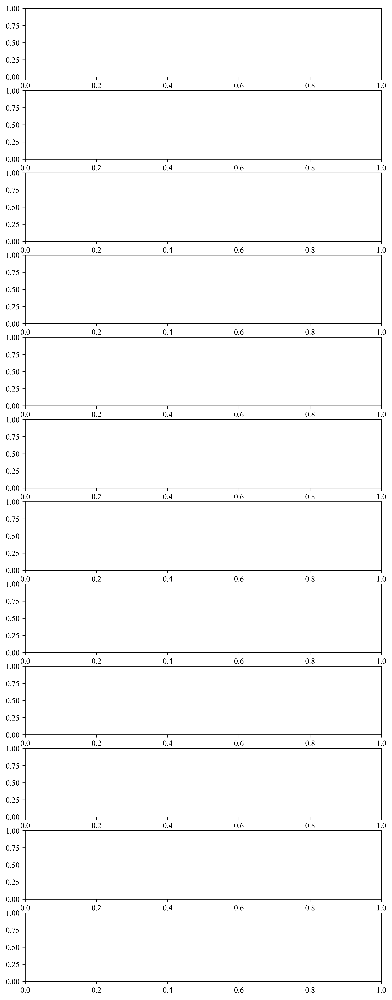

In [6]:

Models_path = '/workspace/data/Interpretable_HTN/model/20230320_011459/20230320_061146/BestF1_2.pt'
save_root = Models_path[:-3]+'/'
layervalue_root = save_root+'/layervalue/'

lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
fig, axs = plt.subplots(nrows=12, ncols=1,figsize=(8,22),dpi = 500)
ECG_y = np.array(ECG_dignose_isoline)
colors_z = (layervalue)
t = np.arange(0,ECG_y.shape[-1]) #总步长 L 

sample_count = 0
for index in range(test_dataset.__len__()):#test_dataset.__len__()
    info =test_dataset.infos.iloc[index]
    ECGfile_name = info['ECGFilename']
    ECG_ID = info['ID']
    
    if(ECG_ID == ID):
        print((ECG_ID))
        ECG,labels = test_dataset.__getitem__(index)
        ECG = ECG*5000 #恢复
        ECG_dignose_isoline = isoline_correction(np.array(ECG))
        
        layervalue_file = layervalue_root  + ECGfile_name +'.npy'
        layervalue = np.load(layervalue_file)

        x_index = np.arange(0,5000)
        ecg_data = (inputs[0]).to('cpu')
        
        
        for i,ax in enumerate(axs.flat):  # type: ignore
            ax.plot(t, (ECG_y[i]), lw=.5,color='#C82423',label='HTN ECG')
            ax.set_ylim(-500, +500)
            ax.set_xlim(0, ECG_y[i].shape[-1])
            ax.set_aspect(0.2)#用于设置轴缩放的方面，即y-unit与x-unit的比率

            ax.xaxis.set_major_locator(plt.MultipleLocator(100))# type: ignore # 100*0.002s=0.2s = 5格
            # ax.xaxis.set_minor_locator(plt.MultipleLocator(20)) # type: ignore # 20*0.002=0.004S = 1格
            ax.yaxis.set_major_locator(plt.MultipleLocator(500))# type: ignore # 0.1uv*500 = 0.5ms = 5格
            # ax.yaxis.set_minor_locator(plt.MultipleLocator(100))# type: ignore # 0.1uv*100 =0.1ms = 1格 
            ax.grid(which='major', axis='x', linewidth=0.2, linestyle='-', color='k')
            # ax.grid(which='minor', axis='x', linewidth=0.2, linestyle='-', color='k')
            ax.grid(which='major', axis='y', linewidth=0.2, linestyle='-', color='k')
            # ax.grid(which='minor', axis='y', linewidth=0.2, linestyle='-', color='k')
            
            # ax.set_ylabel('ECG voltage (μV)', fontdict=fontdict)
            # if(i == 11):
            #     # ax.set_xlabel('Time (ms)', fontdict=fontdict)
            # else:
            #     ax.axes.xaxis.set_ticklabels([])
            
            ax.axes.xaxis.set_ticklabels([])    
            ax1 = ax.twinx()
            ax1.bar(t, (colors_z[i]),lw=3, alpha=.5, color='#C82423',label='HTN Saliency') 

            ax1.set_ylim(0., 1.2)
            ax1.set_ylabel('Saliency', fontdict=fontdict)
            # ax1.yaxis.set_ticks([0.5,1.0])
            
            ax.set_title(lead_index[i])
            
        ax.get_shared_y_axes()   
        ax.get_shared_x_axes()   
        # 调整子图间距
        plt.tight_layout()
        # 设置大图的标题，并将y参数设为1.05，使其位于大图之外
        fig.suptitle(ID +" "+info['name']+" "+ str(info['gender'])+" "+str(info['label'])+" "+str(info['age'])+" "+info['ECGFilename'], fontsize=15,y=1.0005)
        plt.savefig(ID +"_"+ECGfile_name+'.png')
        

## old

In [ ]:
def layervalue_segement_count(start_index:int,end_index:int,layervalue:np.ndarray,segement_num:int = 10):
    len_ = end_index-start_index
    chanle_num = layervalue.shape[0]
    if(len_<segement_num):
        layervalue_sum = ((layervalue[:,start_index:end_index].sum())/(chanle_num*segement_num*1.0))
        return layervalue_sum
    step = len_//segement_num
    layervalue_sum = np.zeros(segement_num)
    for i in range(segement_num):
        start = start_index+step*i
        sum_sement = layervalue[:,start:(start+step)].sum()/(chanle_num*step*1.0)
        layervalue_sum[i] = layervalue_sum[i]+sum_sement*1. #在这一段step里面，每个时间点的平均重要程度
    return layervalue_sum

In [ ]:
index = 0
segement_number = 10
important_values = np.zeros([6,segement_number])


for index in range(test_dataset.__len__()):#
    important_value = np.zeros([6,segement_number])
    inputs,labels = test_dataset.__getitem__(index)
    if(labels == 0): continue
    info =test_dataset.infos.iloc[index]
    ECGfile_name = info['ECGFilename']
    layervalue_file = layervalue_root  + ECGfile_name +'.npy'
    waves_location_file_root = '/workspace/data/Preprocess_HTN/Waves_2023/'
    waves = pd.read_csv(waves_location_file_root+ECGfile_name+'.csv',index_col=0)
    if(waves.isnull().any().any()):
        continue
    layervalue = np.load(layervalue_file)

    for head_peak in range(1,len(waves.columns)-1):
        if(waves.loc['P'][head_peak] == waves.iloc[:,head_peak].min()): #P波不是第一个识别出来的波形
            p_index = int(waves.loc['P'][head_peak])
            q_index = int(waves.loc['Q'][head_peak])
            r_index = int(waves.loc['R'][head_peak])
            s_index = int(waves.loc['S'][head_peak])
            t_index = int(waves.loc['T'][head_peak])
            t_index_befort = int(waves.loc['T'][head_peak-1])
            if(((waves.loc['P'][head_peak+1]==None)) or((waves.loc['P'][head_peak+1] < t_index))):
                break
            else:
                p_index_next = waves.loc['P'][head_peak+1] 
            important_value[0] = important_value[0]+ layervalue_segement_count(t_index_befort,p_index,layervalue,segement_number)
            important_value[1] = important_value[1]+ layervalue_segement_count(p_index,q_index,layervalue,segement_number)   
            important_value[2] = important_value[2]+ layervalue_segement_count(q_index,r_index,layervalue,segement_number) 
            important_value[3] = important_value[3]+layervalue_segement_count(r_index,s_index,layervalue,segement_number)
            important_value[4] = important_value[4]+ layervalue_segement_count(s_index,t_index,layervalue,segement_number) 
            important_value[5] = important_value[5]+ layervalue_segement_count(t_index,p_index_next,layervalue,segement_number) 
        else:
            break
    important_value = max_min(important_value)
    important_values = important_values + important_value
X_lable = ['0','T','P','Q','R','S','T','P','']
fig,ax = plt.subplots(1,1)
ax.plot(np.arange(important_values.flatten().__len__()), max_min(important_values.flatten()), lw=1,color='k')
ax.axvline(x=0,ls='dashed',lw=0.7,color='r')
ax.axvline(x=10,ls='dashed',lw=0.7,color='g')
ax.axvline(x=20,ls='dashed',lw=0.7,color='b')
ax.axvline(x=30,ls='dashed',lw=0.7,color='c')
ax.axvline(x=40,ls='dashed',lw=0.7,color='m')
ax.axvline(x=50,ls='dashed',lw=0.7,color='r')
ax.axvline(x=60,ls='dashed',lw=0.7,color='g')
ax.set_xlim(-5,65)
ax.set_xticklabels(X_lable)

In [ ]:
index = 0
segement_number = 10
important_values = np.zeros([6,segement_number])


for index in range(test_dataset.__len__()):#
    important_value = np.zeros([6,segement_number])
    inputs,labels = test_dataset.__getitem__(index)
    if(labels == 1): continue
    info =test_dataset.infos.iloc[index]
    ECGfile_name = info['ECGFilename']
    layervalue_file = layervalue_root  + ECGfile_name +'.npy'
    waves_location_file_root = '/workspace/data/Preprocess_HTN/Waves_2023/'
    waves = pd.read_csv(waves_location_file_root+ECGfile_name+'.csv',index_col=0)
    if(waves.isnull().any().any()):
        continue
    layervalue = np.load(layervalue_file)

    for head_peak in range(1,len(waves.columns)-1):
        if(waves.loc['P'][head_peak] == waves.iloc[:,head_peak].min()): #P波不是第一个识别出来的波形
            p_index = int(waves.loc['P'][head_peak])
            q_index = int(waves.loc['Q'][head_peak])
            r_index = int(waves.loc['R'][head_peak])
            s_index = int(waves.loc['S'][head_peak])
            t_index = int(waves.loc['T'][head_peak])
            t_index_befort = int(waves.loc['T'][head_peak-1])
            if(((waves.loc['P'][head_peak+1]==None)) or((waves.loc['P'][head_peak+1] < t_index))):
                break
            else:
                p_index_next = waves.loc['P'][head_peak+1] 
            important_value[0] = important_value[0]+ layervalue_segement_count(t_index_befort,p_index,layervalue,segement_number)
            important_value[1] = important_value[1]+ layervalue_segement_count(p_index,q_index,layervalue,segement_number)   
            important_value[2] = important_value[2]+ layervalue_segement_count(q_index,r_index,layervalue,segement_number) 
            important_value[3] = important_value[3]+layervalue_segement_count(r_index,s_index,layervalue,segement_number)
            important_value[4] = important_value[4]+ layervalue_segement_count(s_index,t_index,layervalue,segement_number) 
            important_value[5] = important_value[5]+ layervalue_segement_count(t_index,p_index_next,layervalue,segement_number) 
        else:
            break
    important_value = max_min(important_value)
    important_values = important_values + important_value
X_lable = ['0','T','P','Q','R','S','T','P','']
fig,ax = plt.subplots(1,1)
ax.plot(np.arange(important_values.flatten().__len__()), max_min(important_values.flatten()), lw=1,color='k')
ax.axvline(x=0,ls='dashed',lw=0.7,color='r')
ax.axvline(x=10,ls='dashed',lw=0.7,color='g')
ax.axvline(x=20,ls='dashed',lw=0.7,color='b')
ax.axvline(x=30,ls='dashed',lw=0.7,color='c')
ax.axvline(x=40,ls='dashed',lw=0.7,color='m')
ax.axvline(x=50,ls='dashed',lw=0.7,color='r')
ax.axvline(x=60,ls='dashed',lw=0.7,color='g')
ax.set_xlim(-5,65)
ax.set_xticklabels(X_lable)

In [ ]:
index = 0
segement_number = 10
ECG_values = np.zeros([6,segement_number])


for index in range(test_dataset.__len__()):#
    ECG_value = np.zeros([6,segement_number])
    inputs,labels = test_dataset.__getitem__(index)
    info =test_dataset.infos.iloc[index]
    ECGfile_name = info['ECGFilename']
    layervalue_file = layervalue_root  + ECGfile_name +'.npy'
    waves_location_file_root = '/workspace/data/Preprocess_HTN/Waves_2023/'
    waves = pd.read_csv(waves_location_file_root+ECGfile_name+'.csv',index_col=0)
    if(waves.isnull().any().any()):
        continue
    # layervalue = np.load(layervalue_file)
    layervalue = np.array(inputs)
    for head_peak in range(1,len(waves.columns)-1):
        if(waves.loc['P'][head_peak] == waves.iloc[:,head_peak].min()): #P波不是第一个识别出来的波形
            p_index = int(waves.loc['P'][head_peak])
            q_index = int(waves.loc['Q'][head_peak])
            r_index = int(waves.loc['R'][head_peak])
            s_index = int(waves.loc['S'][head_peak])
            t_index = int(waves.loc['T'][head_peak])
            t_index_befort = int(waves.loc['T'][head_peak-1])
            if(((waves.loc['P'][head_peak+1]==None)) or((waves.loc['P'][head_peak+1] < t_index))):
                break
            else:
                p_index_next = waves.loc['P'][head_peak+1] 
            ECG_value[0] = ECG_value[0]+ layervalue_segement_count(t_index_befort,p_index,layervalue,segement_number)
            ECG_value[1] = ECG_value[1]+ layervalue_segement_count(p_index,q_index,layervalue,segement_number)   
            ECG_value[2] = ECG_value[2]+ layervalue_segement_count(q_index,r_index,layervalue,segement_number) 
            ECG_value[3] = ECG_value[3]+layervalue_segement_count(r_index,s_index,layervalue,segement_number)
            ECG_value[4] = ECG_value[4]+ layervalue_segement_count(s_index,t_index,layervalue,segement_number) 
            ECG_value[5] = ECG_value[5]+ layervalue_segement_count(t_index,p_index_next,layervalue,segement_number) 
        else:
            break
    ECG_value = max_min(ECG_value)
    ECG_values = ECG_value + ECG_value
X_lable = ['0','T','P','Q','R','S','T','P','']
fig,ax = plt.subplots(1,1)
ax.plot(np.arange(ECG_values.flatten().__len__()), max_min(ECG_values.flatten()), lw=1,color='k')
ax.axvline(x=0,ls='dashed',lw=0.7,color='r')
ax.axvline(x=10,ls='dashed',lw=0.7,color='g')
ax.axvline(x=20,ls='dashed',lw=0.7,color='b')
ax.axvline(x=30,ls='dashed',lw=0.7,color='c')
ax.axvline(x=40,ls='dashed',lw=0.7,color='m')
ax.axvline(x=50,ls='dashed',lw=0.7,color='r')
ax.axvline(x=60,ls='dashed',lw=0.7,color='g')
ax.set_xlim(-5,65)
ax.set_xticklabels(X_lable)

In [ ]:
index = 0
segement_number = 10
important_values = np.zeros([6,segement_number])
Occlusion_root = save_root+'/Occlusion/'

for index in range(test_dataset.__len__()):#
    important_value = np.zeros([6,segement_number])
    inputs,labels = test_dataset.__getitem__(index)
    if(labels == 0) :continue
    info =test_dataset.infos.iloc[index]
    ECGfile_name = info['ECGFilename']
    layervalue_file = Occlusion_root  + ECGfile_name +'.npy'
    waves_location_file_root = '/workspace/data/Preprocess_HTN/Waves_2023/'
    if(not os.path.exists(layervalue_file)):
        print(layervalue_file," not exit")
        continue
    waves = pd.read_csv(waves_location_file_root+ECGfile_name+'.csv',index_col=0)
    if(waves.isnull().any().any()):
        continue
    layervalue = np.load(layervalue_file)

    for head_peak in range(1,len(waves.columns)-1):
        if(waves.loc['P'][head_peak] == waves.iloc[:,head_peak].min()): #P波不是第一个识别出来的波形
            p_index = int(waves.loc['P'][head_peak])
            q_index = int(waves.loc['Q'][head_peak])
            r_index = int(waves.loc['R'][head_peak])
            s_index = int(waves.loc['S'][head_peak])
            t_index = int(waves.loc['T'][head_peak])
            t_index_befort = int(waves.loc['T'][head_peak-1])
            if(((waves.loc['P'][head_peak+1]==None)) or((waves.loc['P'][head_peak+1] < t_index))):
                break
            else:
                p_index_next = waves.loc['P'][head_peak+1] 
            important_value[0] = important_value[0]+ layervalue_segement_count(t_index_befort,p_index,layervalue,segement_number)
            important_value[1] = important_value[1]+ layervalue_segement_count(p_index,q_index,layervalue,segement_number)   
            important_value[2] = important_value[2]+ layervalue_segement_count(q_index,r_index,layervalue,segement_number) 
            important_value[3] = important_value[3]+layervalue_segement_count(r_index,s_index,layervalue,segement_number)
            important_value[4] = important_value[4]+ layervalue_segement_count(s_index,t_index,layervalue,segement_number) 
            important_value[5] = important_value[5]+ layervalue_segement_count(t_index,p_index_next,layervalue,segement_number) 
        else:
            break
    important_value = max_min(important_value)
    important_values = important_values + important_value
X_lable = ['0','T','P','Q','R','S','T','P','']
fig,ax = plt.subplots(1,1)
ax.plot(np.arange(important_values.flatten().__len__()), max_min(important_values.flatten()), lw=1,color='k')
ax.axvline(x=0,ls='dashed',lw=0.7,color='r')
ax.axvline(x=10,ls='dashed',lw=0.7,color='g')
ax.axvline(x=20,ls='dashed',lw=0.7,color='b')
ax.axvline(x=30,ls='dashed',lw=0.7,color='c')
ax.axvline(x=40,ls='dashed',lw=0.7,color='m')
ax.axvline(x=50,ls='dashed',lw=0.7,color='r')
ax.axvline(x=60,ls='dashed',lw=0.7,color='g')
ax.set_xlim(-5,65)
ax.set_xticklabels(X_lable)

In [ ]:
index = 0
segement_number = 10
important_values = np.zeros([6,segement_number])
Occlusion_root = save_root+'/Occlusion/'

for index in range(test_dataset.__len__()):#
    important_value = np.zeros([6,segement_number])
    inputs,labels = test_dataset.__getitem__(index)
    if(labels == 1) :continue
    info =test_dataset.infos.iloc[index]
    ECGfile_name = info['ECGFilename']
    layervalue_file = Occlusion_root  + ECGfile_name +'.npy'
    waves_location_file_root = '/workspace/data/Preprocess_HTN/Waves_2023/'
    if(not os.path.exists(layervalue_file)):
        print(layervalue_file," not exit")
        continue
    waves = pd.read_csv(waves_location_file_root+ECGfile_name+'.csv',index_col=0)
    if(waves.isnull().any().any()):
        continue
    layervalue = np.load(layervalue_file)

    for head_peak in range(1,len(waves.columns)-1):
        if(waves.loc['P'][head_peak] == waves.iloc[:,head_peak].min()): #P波不是第一个识别出来的波形
            p_index = int(waves.loc['P'][head_peak])
            q_index = int(waves.loc['Q'][head_peak])
            r_index = int(waves.loc['R'][head_peak])
            s_index = int(waves.loc['S'][head_peak])
            t_index = int(waves.loc['T'][head_peak])
            t_index_befort = int(waves.loc['T'][head_peak-1])
            if(((waves.loc['P'][head_peak+1]==None)) or((waves.loc['P'][head_peak+1] < t_index))):
                break
            else:
                p_index_next = waves.loc['P'][head_peak+1] 
            important_value[0] = important_value[0]+ layervalue_segement_count(t_index_befort,p_index,layervalue,segement_number)
            important_value[1] = important_value[1]+ layervalue_segement_count(p_index,q_index,layervalue,segement_number)   
            important_value[2] = important_value[2]+ layervalue_segement_count(q_index,r_index,layervalue,segement_number) 
            important_value[3] = important_value[3]+layervalue_segement_count(r_index,s_index,layervalue,segement_number)
            important_value[4] = important_value[4]+ layervalue_segement_count(s_index,t_index,layervalue,segement_number) 
            important_value[5] = important_value[5]+ layervalue_segement_count(t_index,p_index_next,layervalue,segement_number) 
        else:
            break
    important_value = max_min(important_value)
    important_values = important_values + important_value
X_lable = ['0','T','P','Q','R','S','T','P','']
fig,ax = plt.subplots(1,1)
ax.plot(np.arange(important_values.flatten().__len__()), max_min(important_values.flatten()), lw=1,color='k')
ax.axvline(x=0,ls='dashed',lw=0.7,color='r')
ax.axvline(x=10,ls='dashed',lw=0.7,color='g')
ax.axvline(x=20,ls='dashed',lw=0.7,color='b')
ax.axvline(x=30,ls='dashed',lw=0.7,color='c')
ax.axvline(x=40,ls='dashed',lw=0.7,color='m')
ax.axvline(x=50,ls='dashed',lw=0.7,color='r')
ax.axvline(x=60,ls='dashed',lw=0.7,color='g')
ax.set_xlim(-5,65)
ax.set_xticklabels(X_lable)

----------------------------

GradientShap

In [ ]:
NET = [Net.MLBFNet_GUR_o(True,True,True,2,Dropout_rate=0.3) ] # type: ignore
testmodel = NET[0].to(DEVICE)
Models_path = '/workspace/data/Interpretable_HTN/model/20230212_031236/20230212_031236/parameter_EarlyStoping_4.pt'
save_root = Models_path[:-3]+'/'
layervalue_root = save_root+'/layervalue/'
testmodel.load_state_dict(torch.load(Models_path))

In [ ]:
def predict(data,testmodel):
    testmodel.eval()
    output = testmodel(data)
    porbs = torch.nn.functional.softmax(output)
    return porbs

In [ ]:
inputs,labels = test_dataset.__getitem__(index)
info =test_dataset.infos.iloc[index]
ECGfile_name = info['ECGFilename']
testmodel.eval()
inputs = inputs.unsqueeze(0)
inputs = inputs.to(DEVICE)
labels = labels.to(DEVICE)  
predict(inputs,testmodel)

In [ ]:
labels

In [ ]:
from captum.attr import GradientShap
from captum.attr import visualization as viz

In [ ]:
gradient_shap = GradientShap(testmodel)

In [ ]:
rand_img_dist = torch.cat([inputs * 0, inputs * 1])

In [ ]:
rand_img_dist.shape

In [ ]:
attributions_gs = gradient_shap.attribute(inputs,
                                          n_samples=50,
                                          stdevs=0.0001,
                                          baselines=rand_img_dist,
                                          target=labels)


In [ ]:
attributions_gs.shape

遮挡可解释性分析

In [185]:
from captum.attr import Occlusion
from captum.attr import visualization as viz

ModuleNotFoundError: No module named 'captum'

In [186]:
occlusion = Occlusion(testmodel)

NameError: name 'Occlusion' is not defined

In [ ]:
save_root = Models_path[:-3]+'/'
Occlusion_root = save_root+'/Occlusion/'
if(not(os.path.exists(save_root))): os.mkdir(save_root)
if(not(os.path.exists(Occlusion_root))): os.mkdir(Occlusion_root)
lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
x_index = np.arange(0,12)
# fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True,sharey=True,figsize=(45,25), constrained_layout=True,dpi =100)
for index in tqdm(range(test_dataset.__len__())):#test_dataset.__len__()
    
    inputs,labels = test_dataset.__getitem__(index)
    info =test_dataset.infos.iloc[index]
    inputs = inputs.unsqueeze(0)
    ECGfile_name = info['ECGFilename']
    attributions_occ = occlusion.attribute(inputs,
                                        strides = (1, 10), # 遮挡滑动移动步长
                                        target=labels, # 目标类别
                                        sliding_window_shapes=(12, 20), # 遮挡滑块尺寸
                                        baselines=0)
    Occlusion_vlue = attributions_occ.squeeze(0).numpy()
    np.save(Occlusion_root+ECGfile_name,Occlusion_vlue)

In [ ]:
layer2d_vlue = attributions_occ.squeeze(0).numpy()
lead_index = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
x_index = np.arange(0,12)
fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True,sharey=True,figsize=(45,25), constrained_layout=True,dpi =100)
ecg_data,_ = test_dataset.__getitem__(index)

cmap = 'OrRd' 
colors = ECGplot.color_map(layer2d_vlue, cmap)#相当于归一化

for i,ax in enumerate(axs.flat):  # type: ignore
    plot_y = np.array(ecg_data[i]*5000.)#缩放
    t = np.arange(0,5000)
    ECGplot.plot_ECG_line(fig,ax,x = t,y= plot_y,y_name = str(lead_index[i])+" Voltage(mV)",title = lead_index[i])
    for j in t:
        ax.axvline(x=j,alpha=0.1,color=colors[i,j]) #第i导联 第j个时间点的importance value

-----

获取全ECG的频谱信息

In [187]:
import scipy.signal as signal

In [188]:
waves_location_file_root = '/workspace/data/Preprocess_HTN/datas_/Wave/'
segment_num = 500 

segements = np.zeros([test_dataset.__len__(),12,5000])
freqs = np.zeros([test_dataset.__len__(),12,2501])

sample_count = 0
for index in range(test_dataset.__len__()):#test_dataset.__len__()
   
    info =test_dataset.infos.iloc[index]
    ECG,labels = test_dataset.__getitem__(index)
    ECG = ECG*5000 #恢复
    
    ECGfile_name = info['ECGFilename']
    
    freq, dist = signal.periodogram(ECG, fs=500, axis=1)
    dist = (dist - dist.min(axis=1, keepdims=True)) / (dist.max(axis=1, keepdims=True) - dist.min(axis=1, keepdims=True) + 1e-6) #12 lead ,shape（12，251）,max_min dist by each lead

    segements[index] = np.array(ECG).mean(axis= 0) #P-wave segments from each ECG shape liek(n,12,segement_num),The n of different ecGs is not necessarily the same
    freqs[index] = np.array(dist).mean(axis= 0)

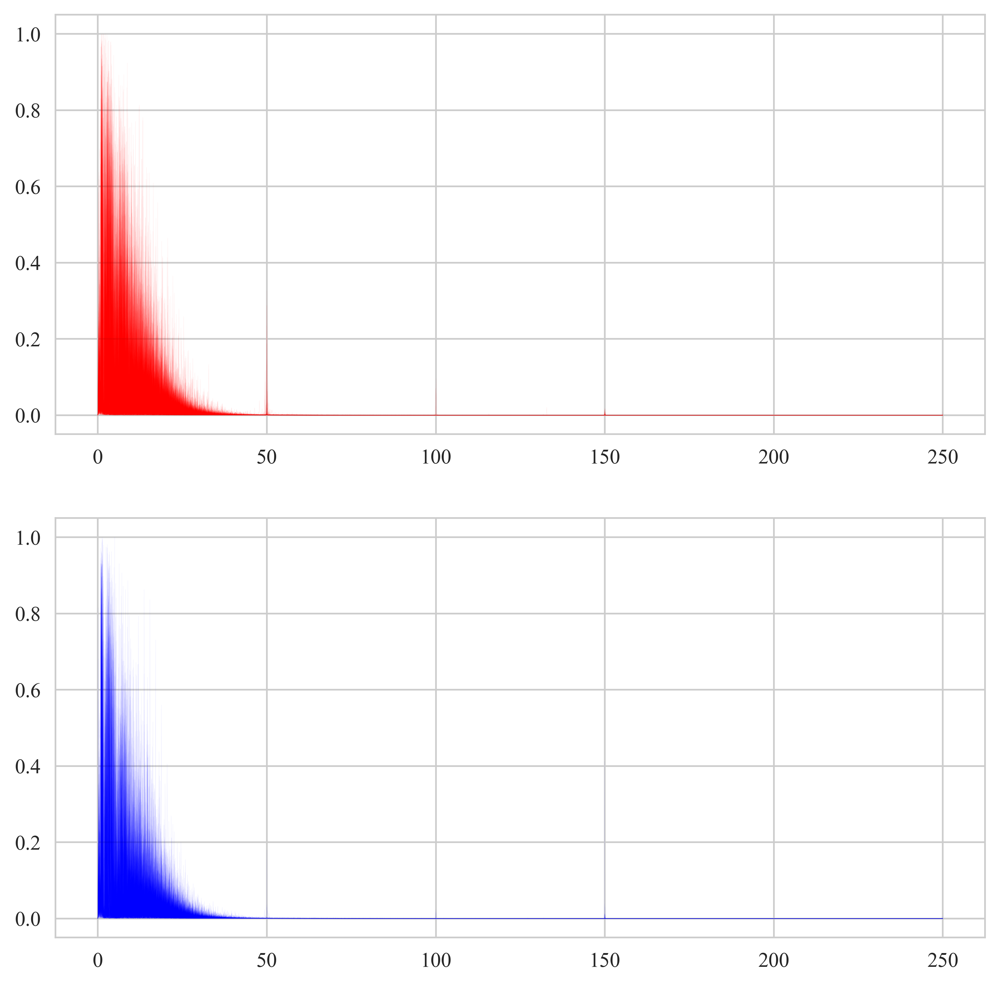

In [189]:
NHTN_freqs = np.zeros([12,2501])
HTN_freqs = np.zeros([12,2501])

HTN_count = 0
NHTN_count = 0
fig, axs = plt.subplots(nrows=2, ncols=1,figsize=(8,8),dpi = 500)
for index in range(test_dataset.__len__()):#test_dataset.__len__()
    ECG,labels = test_dataset.__getitem__(index)
    if(labels):
        HTN_count+=1
        HTN_freqs = HTN_freqs+freqs[index]
        axs[0].plot(freq,freqs[index][0],'r',alpha = .1,lw=0.1)
    else:
        NHTN_count+=1
        NHTN_freqs = NHTN_freqs+freqs[index]
        axs[1].plot(freq,freqs[index][0],'b',alpha = .1,lw=0.1)
HTN_freqs = HTN_freqs/HTN_count
NHTN_freqs = NHTN_freqs/NHTN_count

In [190]:
HTN_freqs = []
NHTN_freqs = []

for index in range(test_dataset.__len__()):#test_dataset.__len__()
    ECG,labels = test_dataset.__getitem__(index)
    if(labels):
        HTN_freqs.append(freqs[index])
    else:
        NHTN_freqs.append(freqs[index])
        
# Importing necessary libraries for T-test
import scipy.stats as stats
import numpy as np
NHTN_freqs = np.array(NHTN_freqs)
HTN_freqs = np.array(HTN_freqs)

    

In [191]:
# Conducting T-test on two samples
# sample1 and sample2 are the two samples to be compared
# Assuming unequal variances between the two samples
# The null hypothesis is that the means of the two samples are equal
# The alternative hypothesis is that the means of the two samples are not equal
p_vals=[]

for Hz in range(500):
    t_stat, p_val = stats.ttest_ind(HTN_freqs[:,1,Hz], NHTN_freqs[:,1,Hz], equal_var=False)
    p_vals.append(p_val)
    # Printing the results of the T-test
    if(p_val<0.01):
        print('Hz:', freq[Hz], "T-statistic:", t_stat, "P-value:", p_val,' *')
    else:
        print('Hz:', freq[Hz], "T-statistic:", t_stat, "P-value:", p_val)

Hz: 0.0 T-statistic: 2.5499833413476756 P-value: 0.011194257652025462
Hz: 0.1 T-statistic: -1.983254152406392 P-value: 0.048028168618622656
Hz: 0.2 T-statistic: -0.708512823738166 P-value: 0.4789351351719938
Hz: 0.30000000000000004 T-statistic: -1.8305261619425446 P-value: 0.0677876732551443
Hz: 0.4 T-statistic: -1.080234840617138 P-value: 0.2805171626180207
Hz: 0.5 T-statistic: -0.7842902742480904 P-value: 0.4332224982660744
Hz: 0.6000000000000001 T-statistic: -0.0904579045842357 P-value: 0.9279569287185372
Hz: 0.7000000000000001 T-statistic: -0.6457768449545668 P-value: 0.5186902270458615
Hz: 0.8 T-statistic: -1.0179111453673022 P-value: 0.30921932688628934
Hz: 0.9 T-statistic: -1.8835988062679796 P-value: 0.06029419676810357
Hz: 1.0 T-statistic: -0.13504396545791136 P-value: 0.8926284092824391
Hz: 1.1 T-statistic: 1.165957090589952 P-value: 0.24413628760515058
Hz: 1.2000000000000002 T-statistic: -2.1031260443474658 P-value: 0.03598452430511588
Hz: 1.3 T-statistic: -0.754204511964515

In [192]:
import neurokit2 as nk

In [193]:
def get_ECG_peack_NK(ECG:np.array):
    ECG_clean = np.zeros_like(ECG)
    num_beats = []
    waves_peak = {}
    for i in range(12):
        ECG_clean[i]= nk.ecg_clean(ECG[i], sampling_rate=500)
        _, rpeaks = nk.ecg_peaks(ECG_clean[i], sampling_rate=500)
        signal_peak, waves_peak = nk.ecg_delineate(ECG_clean[i], 
                                           rpeaks, 
                                           sampling_rate=500,
                                           method="dwt")
        num_beats.append(len(rpeaks['ECG_R_Peaks']))
    mode_num_beats = max(set(num_beats), key=num_beats.count)
    consistent_beats = [i for i in range(12) if num_beats[i] == mode_num_beats]
    ECG_P_Peaks = []
    ECG_P_Onsets = []
    ECG_P_Offsets = []
    ECG_Q_Peaks = []
    ECG_R_Onsets = []
    ECG_R_Offsets = []
    ECG_S_Peaks = []
    ECG_T_Peaks = []
    ECG_T_Onsets = []
    ECG_T_Offsets = []
    for i in consistent_beats:
        ECG_P_Peaks.append(waves_peak['ECG_P_Peaks'])
        ECG_P_Onsets.append(waves_peak['ECG_P_Onsets'])
        ECG_P_Offsets.append(waves_peak['ECG_P_Offsets'])
        ECG_Q_Peaks.append(waves_peak['ECG_Q_Peaks'])
        ECG_R_Onsets.append(waves_peak['ECG_R_Onsets'])
        ECG_R_Offsets.append(waves_peak['ECG_R_Offsets'])
        ECG_S_Peaks.append(waves_peak['ECG_S_Peaks'])
        ECG_T_Peaks.append(waves_peak['ECG_T_Peaks'])
        ECG_T_Onsets.append(waves_peak['ECG_T_Onsets'])
        ECG_T_Offsets.append(waves_peak['ECG_T_Offsets'])
    ECG_P_Peaks = np.mean(ECG_P_Peaks, axis=0)
    ECG_P_Onsets = np.mean(ECG_P_Onsets, axis=0)
    ECG_P_Offsets = np.mean(ECG_P_Offsets, axis=0)
    ECG_Q_Peaks = np.mean(ECG_Q_Peaks, axis=0)
    ECG_R_Onsets = np.mean(ECG_R_Onsets, axis=0)
    ECG_R_Offsets = np.mean(ECG_R_Offsets, axis=0)
    ECG_S_Peaks = np.mean(ECG_S_Peaks, axis=0)
    ECG_T_Peaks = np.mean(ECG_T_Peaks, axis=0)
    ECG_T_Onsets = np.mean(ECG_T_Onsets, axis=0)
    ECG_T_Offsets = np.mean(ECG_T_Offsets, axis=0)
    return pd.DataFrame({'P_peak': ECG_P_Peaks, 
                        'P_start': ECG_P_Onsets  ,
                        'P_end': ECG_P_Offsets ,
                        'Q_start': ECG_Q_Peaks ,
                        'ECG_R_Onsets': ECG_R_Onsets ,
                        'ECG_R_Offsets': ECG_R_Offsets,
                        'S_peak': ECG_S_Peaks ,
                        'T_peaks': ECG_T_Peaks ,
                        'T_start': ECG_T_Onsets,
                        'T_end': ECG_T_Offsets })



获取P波的频谱信息 

In [194]:
waves_location_file_root = '/workspace/data/Preprocess_HTN/datas_/Wave/'
select_list =['P_start', 'Q_start',]
segment_num = 500 

segements = np.zeros([test_dataset.__len__(),12,500])
freqs = np.zeros([test_dataset.__len__(),12,251])

sample_count = 0

lens = []
for index in range(test_dataset.__len__()):#test_dataset.__len__()
   
    info =test_dataset.infos.iloc[index]
    ECG,labels = test_dataset.__getitem__(index)
    ECG = ECG*5000 #恢复
    ECGfile_name = info['ECGFilename']
    try:
        waves = np.load(waves_location_file_root+'/FPT/'+ECGfile_name+'.npy')
        waves_ = pd.DataFrame(waves[1:-1],columns=['P_start', 'P_peak', 'P_end','Q_start', 'Q_peak', 'R_peak', 'S_peak', 'S_end','J','T_start', 'T_peak', 'T_end','res0'])
    except:
        print(ECGfile_name)
        waves = get_ECG_peack_NK(ECG)
        waves_ = pd.DataFrame(waves[1:-1])
    waves = waves_[select_list].copy()
    if(waves.isnull().any().any()):
        continue
    segmentsList =[]
    freqList = []
    for bet in range(len(waves.index)):
        segment = np.zeros([12,500])
        for peak in range(len(waves.columns)-1):
            start = int(waves.loc[bet][peak])
            end = int(waves.loc[bet][peak+1])
            if end-start > 500:
                continue
            lens.append(end-start)
            if (start >= end): continue
            segment = ECG[:,start:end].numpy()
            if segment.shape[1] < 500:
                segment = np.pad(segment, ((0,0),(0,segment_num-segment.shape[1])), 'constant') #长度不足segement_num，在后面补零
            
            freq, dist = signal.periodogram(segment, fs=500, axis=1)
            dist = (dist - dist.min(axis=1, keepdims=True)) / (dist.max(axis=1, keepdims=True) - dist.min(axis=1, keepdims=True) + 1e-6) #12 lead ,shape（12，251）,max_min dist by each lead
        segmentsList.append(segment)
        freqList.append(dist)

    segements[index] = np.array(segmentsList).mean(axis= 0) #P-wave segments from each ECG shape liek(n,12,segement_num),The n of different ecGs is not necessarily the same
    freqs[index] = np.array(freqList).mean(axis= 0)


In [195]:
np.array(lens).mean()

82.94053005817712

In [196]:
HTN_freqs = []
NHTN_freqs = []

for index in range(test_dataset.__len__()):#test_dataset.__len__()
    ECG,labels = test_dataset.__getitem__(index)
    if(labels):
        HTN_freqs.append(freqs[index])
    else:
        NHTN_freqs.append(freqs[index])

In [197]:
NHTN_freqs = np.array(NHTN_freqs)

In [198]:
HTN_freqs = np.array(HTN_freqs)

In [199]:
HTN_freqs.shape

(317, 12, 251)

In [200]:
HTN_freqs.mean(axis=0).shape

(12, 251)

In [201]:
# Importing necessary libraries for T-test
import scipy.stats as stats
import numpy as np

# Conducting T-test on two samples
# sample1 and sample2 are the two samples to be compared
# Assuming unequal variances between the two samples
# The null hypothesis is that the means of the two samples are equal
# The alternative hypothesis is that the means of the two samples are not equal
p_vals=[]

for Hz in range(45):
    t_stat, p_val = stats.ttest_ind(HTN_freqs[:,0,Hz], NHTN_freqs[:,0,Hz], equal_var=False)
    p_vals.append(p_val)
    # Printing the results of the T-test
    if(p_val<0.01):
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val,' *')
    else:
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val)
        
    
    

Hz: 0 T-statistic: 1.7465542897773383 P-value: 0.08126883608693679
Hz: 1 T-statistic: -1.748796215326344 P-value: 0.08088371173623973
Hz: 2 T-statistic: -2.3286415523957578 P-value: 0.020238383388206268
Hz: 3 T-statistic: -1.3989065794912503 P-value: 0.16240042591550732
Hz: 4 T-statistic: 0.3781570596169032 P-value: 0.7054593868909655
Hz: 5 T-statistic: 1.8982026867992494 P-value: 0.05819614719498955
Hz: 6 T-statistic: 2.736900975485895 P-value: 0.0064060238878114895  *
Hz: 7 T-statistic: 2.6512217037159385 P-value: 0.008256797759639698  *
Hz: 8 T-statistic: 1.8121219895351244 P-value: 0.07053094486167263
Hz: 9 T-statistic: 0.5803282293536026 P-value: 0.5619412824016186
Hz: 10 T-statistic: -0.6607258434795501 P-value: 0.5090762157233124
Hz: 11 T-statistic: -1.5713062289229178 P-value: 0.11670087735957091
Hz: 12 T-statistic: -1.8547144149500983 P-value: 0.06417346034065188
Hz: 13 T-statistic: -1.2684985504037207 P-value: 0.20514981373074753
Hz: 14 T-statistic: -0.09687484560094622 P-val

/tmp/ipykernel_8565/1150982243.py:27: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_yticklabels(['0','0.1','0.01','0.001','0.00001'], fontdict=fontdict)


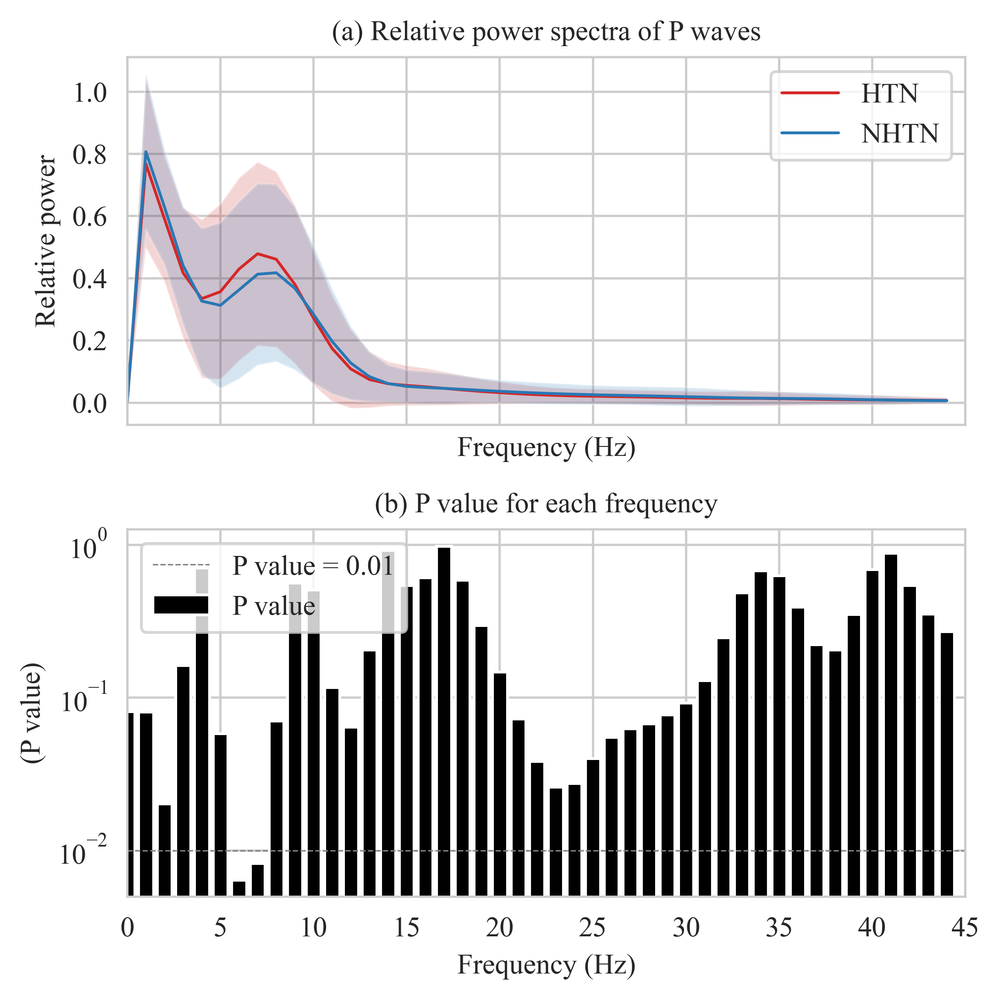

In [202]:
fig, axs = plt.subplots(nrows=2, ncols=1,figsize=(5,5), dpi=500,sharex=True)
axs[0].plot(freq[:45], (HTN_freqs.mean(axis = 0))[0,:45],lw=1, color='C82423',label='HTN') 
axs[0].fill_between(freq[:45], 
                ((HTN_freqs.mean(axis = 0))[0,:45])-((HTN_freqs.std(axis = 0))[0,:45]), 
                ((HTN_freqs.mean(axis = 0))[0,:45])+((HTN_freqs.std(axis = 0))[0,:45]),
                facecolor='#C82423', alpha=.2)
axs[0].plot(freq[:45], (NHTN_freqs.mean(axis = 0))[0,:45],lw=1, color='#2878B5',label='NHTN') 
axs[0].fill_between(freq[:45], 
                ((NHTN_freqs.mean(axis = 0))[0,:45])-((NHTN_freqs.std(axis = 0))[0,:45]), 
                ((NHTN_freqs.mean(axis = 0))[0,:45])+((NHTN_freqs.std(axis = 0))[0,:45]),
                facecolor='#2878B5', alpha=.2)
axs[0].legend()
axs[0].set_xlim(0,45)
axs[0].set_xticks([0,5,10,15,20,25,30,35,40,45])
axs[0].set_xticklabels(['0','5','10','15','20','25','30','35','40','45'], fontdict=fontdict)
axs[0].set_ylabel('Relative power', fontdict=fontdict)
axs[0].set_xlabel('Frequency (Hz)', fontdict=fontdict)
axs[0].set_title('(a) Relative power spectra of P waves', fontdict=fontdict)

axs[1].set_ylabel('(P value)', fontdict=fontdict)
axs[1].set_xlabel('Frequency (Hz)', fontdict=fontdict)
axs[1].set_title('(b) P value for each frequency', fontdict=fontdict)
axs[1].bar(freq[:45],np.array(p_vals),lw=1,color = 'black',label = 'P value')
axs[1].axhline(y=0.01, linestyle='--', lw=0.5,color='gray',label = 'P value = 0.01')

axs[1].set_xticks([0,5,10,15,20,25,30,35,40,45])
axs[1].set_yticklabels(['0','0.1','0.01','0.001','0.00001'], fontdict=fontdict)
axs[1].set_yscale('log')
axs[1].legend()

plt.tight_layout()
plt.savefig("FFT.pdf", transparent=True)

In [203]:
# Importing necessary libraries for T-test
import scipy.stats as stats

# Conducting T-test on two samples
# sample1 and sample2 are the two samples to be compared
# Assuming unequal variances between the two samples
# The null hypothesis is that the means of the two samples are equal
# The alternative hypothesis is that the means of the two samples are not equal
p_vals=[]

for Hz in range(45):
    t_stat, p_val = stats.ttest_ind(HTN_freqs[:,1,Hz], NHTN_freqs[:,1,Hz], equal_var=False)
    p_vals.append(p_val)
    # Printing the results of the T-test
    if(p_val<0.01):
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val,' *')
    else:
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val)
    

Hz: 0 T-statistic: -0.8915263076553538 P-value: 0.37307896036598287
Hz: 1 T-statistic: -1.1646248449883265 P-value: 0.24468306966144182
Hz: 2 T-statistic: -0.0536956346014091 P-value: 0.957197580419811
Hz: 3 T-statistic: 1.8738405804967475 P-value: 0.061477984295888355
Hz: 4 T-statistic: 2.7596005812377564 P-value: 0.005976676465202316  *
Hz: 5 T-statistic: 2.6762413593250223 P-value: 0.0076650476905114106  *
Hz: 6 T-statistic: 1.7065459427387668 P-value: 0.08847663595524047
Hz: 7 T-statistic: 0.08592238507000982 P-value: 0.9315605639001958
Hz: 8 T-statistic: -1.589429557040778 P-value: 0.11257376441999735
Hz: 9 T-statistic: -2.9088615433345524 P-value: 0.003786239421398891  *
Hz: 10 T-statistic: -3.762855991533058 P-value: 0.00018799776976675714  *
Hz: 11 T-statistic: -4.141074753839972 P-value: 4.0844694389538976e-05  *
Hz: 12 T-statistic: -4.024722607822612 P-value: 6.683585146132498e-05  *
Hz: 13 T-statistic: -3.2569826433415066 P-value: 0.0012136621858435828  *
Hz: 14 T-statistic:

In [204]:
HTN_freqs.shape

(317, 12, 251)

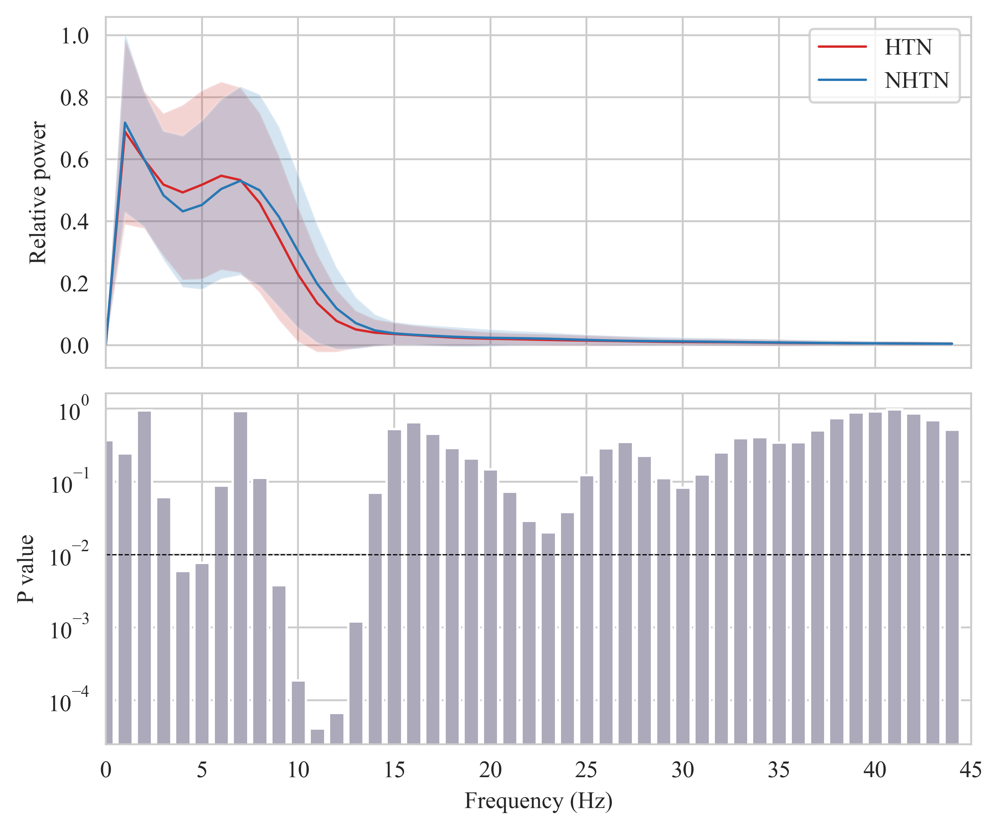

In [211]:
fig, axs = plt.subplots(nrows=2, ncols=1,figsize=(6,5), dpi=500,sharex=True)
axs[0].plot(freq[:45], (HTN_freqs.mean(axis = 0))[1,:45],lw=1, color='C82423',label='HTN') 
axs[0].fill_between(freq[:45], 
                ((HTN_freqs.mean(axis = 0))[1,:45])-((HTN_freqs.std(axis = 0))[1,:45]), 
                ((HTN_freqs.mean(axis = 0))[1,:45])+((HTN_freqs.std(axis = 0))[1,:45]),
                facecolor='#C82423', alpha=.2)
axs[0].plot(freq[:45], (NHTN_freqs.mean(axis = 0))[1,:45],lw=1, color='#2878B5',label='NHTN') 
axs[0].fill_between(freq[:45], 
                ((NHTN_freqs.mean(axis = 0))[1,:45])-((NHTN_freqs.std(axis = 0))[1,:45]), 
                ((NHTN_freqs.mean(axis = 0))[1,:45])+((NHTN_freqs.std(axis = 0))[1,:45]),
                facecolor='#2878B5', alpha=.2)
axs[0].legend()
axs[0].set_xlim(0,45)
axs[0].set_xticks([0,5,10,15,20,25,30,35,40,45])
axs[0].set_xticklabels(['0','5','10','15','20','25','30','35','40','45'], fontdict=fontdict)
axs[0].set_ylabel('Relative power', fontdict=fontdict)
axs[0].set_xlabel('')
axs[0].set_title('')
axs[0].spines['left'].set_visible(True)

axs[1].set_ylabel('P value', fontdict=fontdict)
axs[1].set_xlabel('Frequency (Hz)', fontdict=fontdict)
axs[1].set_title('')
axs[1].bar(freq[:45],np.array(p_vals),lw=1,color = '#ACA9BB',label = 'P value')
axs[1].axhline(y=0.01, linestyle='--', lw=0.5,color='black',label = 'P value = 0.01')
axs[1].spines['left'].set_visible(True)
axs[1].set_xticks([0,5,10,15,20,25,30,35,40,45])
# axs[1].set_yticklabels(['0','0.1','0.01','0.001','0.00001'], fontdict=fontdict)
axs[1].set_yscale('log')
# axs[1].legend()

plt.tight_layout()
plt.savefig("FFT.pdf", transparent=True)

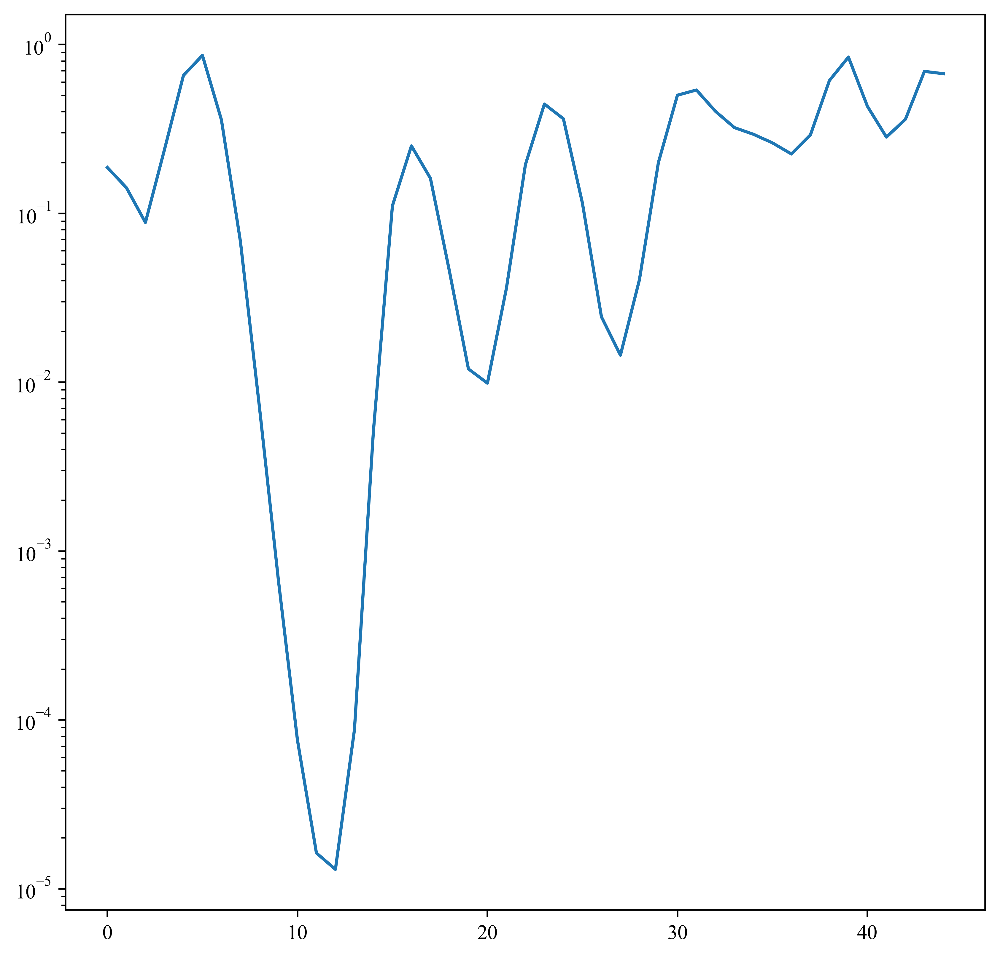

In [83]:
fig, axs = plt.subplots(nrows=1, ncols=1,figsize=(8,8),dpi = 500,sharex=True)
axs.plot(p_vals)
axs.set_yscale('log')
plt.show()

In [114]:
# Importing necessary libraries for T-test
import scipy.stats as stats
import numpy as np

# Conducting T-test on two samples
# sample1 and sample2 are the two samples to be compared
# Assuming unequal variances between the two samples
# The null hypothesis is that the means of the two samples are equal
# The alternative hypothesis is that the means of the two samples are not equal
p_vals=[]

for Hz in range(45):
    t_stat, p_val = stats.ttest_ind(HTN_freqs[:,2,Hz], NHTN_freqs[:,2,Hz], equal_var=False)
    p_vals.append(p_val)
    # Printing the results of the T-test
    if(p_val<0.01):
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val,' *')
    else:
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val)
    

Hz: 0 T-statistic: 0.14167985967161434 P-value: 0.8873843694351856
Hz: 1 T-statistic: 1.6896694825885108 P-value: 0.09167474456582601
Hz: 2 T-statistic: 0.5220004082458647 P-value: 0.6018913916388785
Hz: 3 T-statistic: -1.2886831122014697 P-value: 0.19803434175761625
Hz: 4 T-statistic: -2.2440072918119256 P-value: 0.02521430809300783
Hz: 5 T-statistic: -2.7154267268548473 P-value: 0.00682440362356309  *
Hz: 6 T-statistic: -2.8802060369142213 P-value: 0.004133092562587491  *
Hz: 7 T-statistic: -2.8502576378908424 P-value: 0.004541655097263305  *
Hz: 8 T-statistic: -2.7132126662412297 P-value: 0.006885748687809771  *
Hz: 9 T-statistic: -2.4747317657265087 P-value: 0.01365039007104168
Hz: 10 T-statistic: -2.179006882585714 P-value: 0.029774702578669102
Hz: 11 T-statistic: -1.9039195879598128 P-value: 0.05747194645781845
Hz: 12 T-statistic: -1.6346449971072783 P-value: 0.10274434875619318
Hz: 13 T-statistic: -1.3175198936086885 P-value: 0.18827059282221237
Hz: 14 T-statistic: -0.9782183383

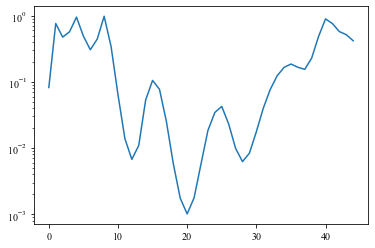

In [31]:
plt.plot(p_vals)
plt.yscale('log')
plt.show()

In [115]:
# Importing necessary libraries for T-test
import scipy.stats as stats
import numpy as np

# Conducting T-test on two samples
# sample1 and sample2 are the two samples to be compared
# Assuming unequal variances between the two samples
# The null hypothesis is that the means of the two samples are equal
# The alternative hypothesis is that the means of the two samples are not equal
p_vals=[]

for Hz in range(45):
    t_stat, p_val = stats.ttest_ind(HTN_freqs[:,3,Hz], NHTN_freqs[:,3,Hz], equal_var=False)
    p_vals.append(p_val)
    # Printing the results of the T-testv
    if(p_val<0.01):
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val,' *')
    else:
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val)
    

Hz: 0 T-statistic: -1.0700336220001878 P-value: 0.28517433055220204
Hz: 1 T-statistic: 1.0593854478237579 P-value: 0.2898787314916195
Hz: 2 T-statistic: 1.2714301471844984 P-value: 0.20408681886400992
Hz: 3 T-statistic: 1.033175845409227 P-value: 0.3019541764141385
Hz: 4 T-statistic: 0.7732869578855628 P-value: 0.439678652740055
Hz: 5 T-statistic: 0.7126012380234427 P-value: 0.47638964679366
Hz: 6 T-statistic: 0.4091100862394662 P-value: 0.6826125193392679
Hz: 7 T-statistic: -0.457036750947589 P-value: 0.6478162324320964
Hz: 8 T-statistic: -1.715061250894521 P-value: 0.08687603677020214
Hz: 9 T-statistic: -2.9312069824265814 P-value: 0.003517973068235398  *
Hz: 10 T-statistic: -3.8448649634830754 P-value: 0.00013599008408089034  *
Hz: 11 T-statistic: -4.342319446636147 P-value: 1.733628241508934e-05  *
Hz: 12 T-statistic: -4.340332847276483 P-value: 1.776557599399127e-05  *
Hz: 13 T-statistic: -3.6790953876849772 P-value: 0.0002638150738396251  *
Hz: 14 T-statistic: -2.3092819328829823

In [116]:
# Importing necessary libraries for T-test
import scipy.stats as stats
import numpy as np

# Conducting T-test on two samples
# sample1 and sample2 are the two samples to be compared
# Assuming unequal variances between the two samples
# The null hypothesis is that the means of the two samples are equal
# The alternative hypothesis is that the means of the two samples are not equal
p_vals=[]

for Hz in range(45):
    t_stat, p_val = stats.ttest_ind(HTN_freqs[:,4,Hz], NHTN_freqs[:,4,Hz], equal_var=False)
    p_vals.append(p_val)
    # Printing the results of the T-testv
    if(p_val<0.01):
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val,' *')
    else:
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val)
    

Hz: 0 T-statistic: 0.21424406793833434 P-value: 0.8304368931539923
Hz: 1 T-statistic: 0.19822179673081897 P-value: 0.842945680198159
Hz: 2 T-statistic: -1.9792059716980945 P-value: 0.04828217560203191
Hz: 3 T-statistic: -2.844274574322364 P-value: 0.0046094122590217956  *
Hz: 4 T-statistic: -2.1811035440256523 P-value: 0.029585995293614043
Hz: 5 T-statistic: -1.278355246510012 P-value: 0.2016594952263086
Hz: 6 T-statistic: -0.3806334993880657 P-value: 0.703623079407274
Hz: 7 T-statistic: 0.2528134849814808 P-value: 0.8005073825622515
Hz: 8 T-statistic: 0.46332515596844986 P-value: 0.6433141399686684
Hz: 9 T-statistic: 0.296561775931956 P-value: 0.7669114637313948
Hz: 10 T-statistic: -0.029896113247335005 P-value: 0.9761604981317944
Hz: 11 T-statistic: -0.29629331664113084 P-value: 0.7671145814383296
Hz: 12 T-statistic: -0.36229161234488905 P-value: 0.7172679250183098
Hz: 13 T-statistic: -0.21751508050176932 P-value: 0.8278838092528912
Hz: 14 T-statistic: -0.0018322777562941128 P-value:

In [117]:
# Importing necessary libraries for T-test
import scipy.stats as stats
import numpy as np

# Conducting T-test on two samples
# sample1 and sample2 are the two samples to be compared
# Assuming unequal variances between the two samples
# The null hypothesis is that the means of the two samples are equal
# The alternative hypothesis is that the means of the two samples are not equal
p_vals=[]

for Hz in range(45):
    t_stat, p_val = stats.ttest_ind(HTN_freqs[:,5,Hz], NHTN_freqs[:,5,Hz], equal_var=False)
    p_vals.append(p_val)
    # Printing the results of the T-testv
    if(p_val<0.01):
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val,' *')
    else:
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val)
    

Hz: 0 T-statistic: -0.6956085316199286 P-value: 0.4869970473508257
Hz: 1 T-statistic: 0.995927507238854 P-value: 0.3197335290896576
Hz: 2 T-statistic: 0.9070094210403734 P-value: 0.3648240001587414
Hz: 3 T-statistic: 0.5481276564878086 P-value: 0.5838263239712262
Hz: 4 T-statistic: 0.01436001382499272 P-value: 0.988547757670695
Hz: 5 T-statistic: -0.583493363379698 P-value: 0.5597916616021843
Hz: 6 T-statistic: -1.2271723070441651 P-value: 0.22027572642844162
Hz: 7 T-statistic: -1.875560596457489 P-value: 0.061249610482149164
Hz: 8 T-statistic: -2.4506523524789143 P-value: 0.014577384700348004
Hz: 9 T-statistic: -2.889280881191116 P-value: 0.0040199764421235485  *
Hz: 10 T-statistic: -3.210862321975857 P-value: 0.0014069764007223133  *
Hz: 11 T-statistic: -3.4285553458169415 P-value: 0.0006594734784211429  *
Hz: 12 T-statistic: -3.446200890773407 P-value: 0.0006240148699300996  *
Hz: 13 T-statistic: -3.053210462757501 P-value: 0.00241103882474602  *
Hz: 14 T-statistic: -2.2184960860151

In [118]:
# Importing necessary libraries for T-test
import scipy.stats as stats
import numpy as np

# Conducting T-test on two samples
# sample1 and sample2 are the two samples to be compared
# Assuming unequal variances between the two samples
# The null hypothesis is that the means of the two samples are equal
# The alternative hypothesis is that the means of the two samples are not equal
p_vals=[]

for Hz in range(45):
    t_stat, p_val = stats.ttest_ind(HTN_freqs[:,6,Hz], NHTN_freqs[:,6,Hz], equal_var=False)
    p_vals.append(p_val)
    # Printing the results of the T-testv
    if(p_val<0.01):
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val,' *')
    else:
        print('Hz:', Hz, "T-statistic:", t_stat, "P-value:", p_val)
    

Hz: 0 T-statistic: -1.7952324886190882 P-value: 0.07337927787275862
Hz: 1 T-statistic: 0.515185511223181 P-value: 0.6066335433666992
Hz: 2 T-statistic: -0.7086581463199344 P-value: 0.478834459808951
Hz: 3 T-statistic: -1.2341087122942127 P-value: 0.21767438868930214
Hz: 4 T-statistic: -0.9677752421467967 P-value: 0.33357340415712855
Hz: 5 T-statistic: -0.818382608710626 P-value: 0.4134866466000737
Hz: 6 T-statistic: -0.7373668167397313 P-value: 0.4612110534054691
Hz: 7 T-statistic: -0.8189241624559631 P-value: 0.4131861719082349
Hz: 8 T-statistic: -0.9978437904991024 P-value: 0.3187993599413742
Hz: 9 T-statistic: -1.145923014159438 P-value: 0.2523306641751856
Hz: 10 T-statistic: -1.2046443245596805 P-value: 0.22886136998377404
Hz: 11 T-statistic: -1.1964000083009958 P-value: 0.23205766869159772
Hz: 12 T-statistic: -1.1725757073409704 P-value: 0.24148012840726643
Hz: 13 T-statistic: -1.2179928329181253 P-value: 0.22376341708837935
Hz: 14 T-statistic: -1.3787552606714828 P-value: 0.16854

---
绘制年龄性别分布

In [6]:
df = ALL_data_buffer

In [7]:
fontdict = {'family' : 'Times New Roman', 'size' : 10}
plt.rc('font',family='Times New Roman')
plt.rcParams['font.sans-serif'] = ['SimHei'] #或者把"SimHei"换为"KaiTi"
plt.rcParams['axes.unicode_minus'] = False  # 解决保存图像是负号'-'显示为方块的问题

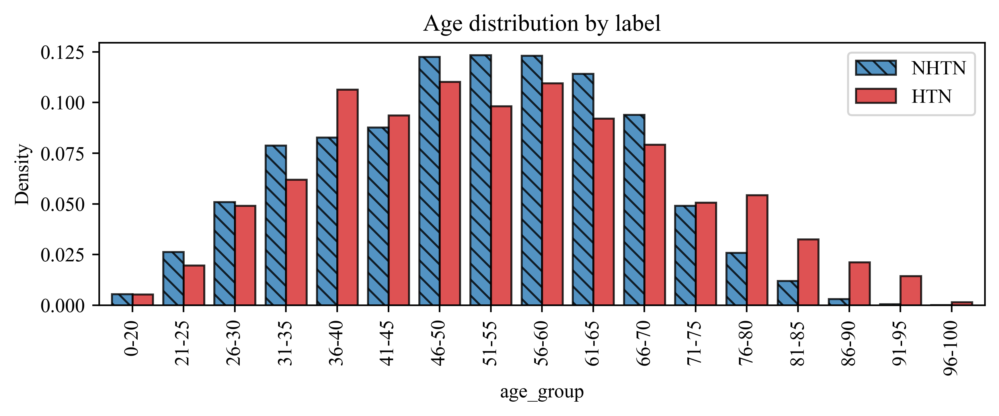

In [8]:

bins = [0, 20,25,30, 35,40, 45,50, 55,60, 65,70, 75, 80,85,90,95,100]
labels = ['0-20', '20-25', '25-30','30-35','35-40','40-45', '45-50','50-55', '55-60','60-65', '65-70','70-75', '75-80','80-85','85-90','90-95','95-100']
df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels)

# 按照label和age_group分组，计算每个组的样本占比
df_grouped = df.groupby(['label', 'age_group'])['age'].count() / df.groupby(['label'])['age'].count()

# 将数据转换为透视表，方便绘图
df_pivot = df_grouped.unstack(level=0)

# 绘制柱状图
ax = df_pivot.plot(kind='bar', stacked=False,color = ['#2878B5','C82423'], width=0.8,alpha = 0.8,label=['NHTN','HTN'],edgecolor='k')

# 设置横坐标标签
ax.set_xticklabels(['0-20', '21-25', '26-30','31-35','36-40','41-45', '46-50','51-55', '56-60','61-65', '66-70','71-75', '76-80','81-85','86-90','91-95','96-100'])
ax.grid(False)

# 设置标题和纵坐标标签
plt.title('Age distribution by label')
plt.ylabel('Density')
# x = np.array(np.arange(0,17))
# y = df_pivot[0].values
# plt.plot(x, y, 'k--',lw = 0.5)
# x = np.array(np.arange(0,17))
# y = df_pivot[1].values
# plt.plot(x, y, 'k.-',lw = 0.5)

# 在类别为0的条形图的柱子上添加斜线条纹填充
for i, bar in enumerate(ax.containers[0]):
    bar.set_hatch('\\\\\\')

fig = plt.gcf()
fig.set_size_inches(7, 3)
fig.set_dpi(500)
# 绘制图例
ax.legend(['NHTN', 'HTN'], loc='upper right')
plt.tight_layout()
plt.savefig("age_distribution.pdf", transparent=True)
# 显示图形
plt.show()

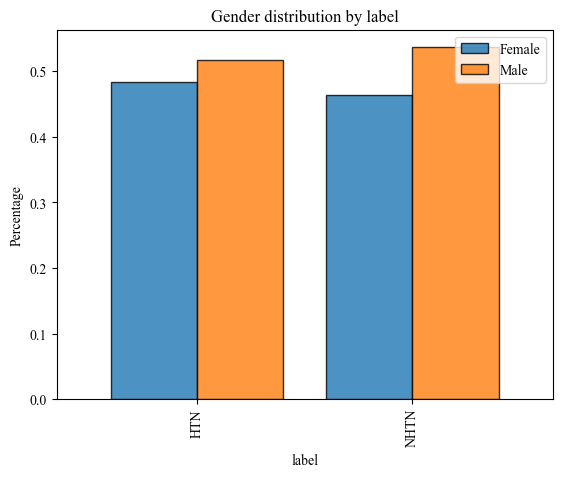

In [9]:
# 绘制label的gender分组条形图
df_gender = df.groupby(['label', 'gender'])['age'].count() / df.groupby(['label'])['age'].count()
df_gender_pivot = df_gender.unstack(level=1)
ax = df_gender_pivot.plot(kind='bar',  width=0.8,alpha = 0.8,stacked=False,edgecolor='k')
ax.set_xticklabels(['HTN', 'NHTN'])
ax.legend(['Female', 'Male'], loc='upper right')
plt.title('Gender distribution by label')
plt.ylabel('Percentage')
plt.show()

/tmp/ipykernel_12000/956216580.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(['0.0','2.5%','5.0%','7.5%','10.0%','12.5%'])
/tmp/ipykernel_12000/956216580.py:52: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


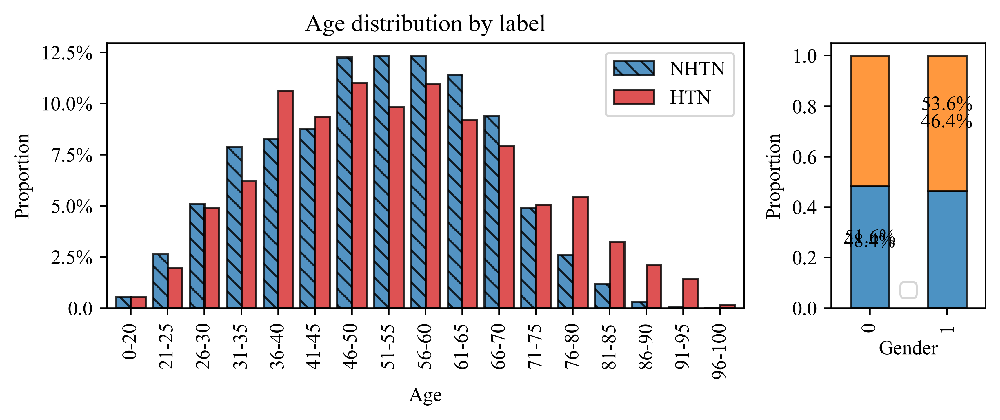

In [16]:
# 将上述两张图作为子图画在一个figsize为（7，3）的大图上
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

fig = plt.figure(layout="constrained",figsize=(7, 3),dpi = 500)
gs = GridSpec(1, 4, figure=fig)
ax1 =  fig.add_subplot(gs[0, :-1])
ax2 =  fig.add_subplot(gs[0, -1])
bins = [0, 20,25,30, 35,40, 45,50, 55,60, 65,70, 75, 80,85,90,95,100]
labels = ['0-20', '20-25', '25-30','30-35','35-40','40-45', '45-50','50-55', '55-60','60-65', '65-70','70-75', '75-80','80-85','85-90','90-95','95-100']
df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels)

# 按照label和age_group分组，计算每个组的样本占比
df_grouped = df.groupby(['label', 'age_group'])['age'].count() / df.groupby(['label'])['age'].count()

# 将数据转换为透视表，方便绘图
df_pivot = df_grouped.unstack(level=0)

# 绘制柱状图
df_pivot.plot(kind='bar', stacked=False,color = ['#2878B5','C82423'], width=0.8,alpha = 0.8,label=['NHTN','HTN'],edgecolor='k',ax = ax1)

# 设置横坐标标签
ax1.set_xticklabels(['0-20', '21-25', '26-30','31-35','36-40','41-45', '46-50','51-55', '56-60','61-65', '66-70','71-75', '76-80','81-85','86-90','91-95','96-100'])
ax1.set_yticklabels(['0.0','2.5%','5.0%','7.5%','10.0%','12.5%'])
ax1.grid(False)

# 设置标题和纵坐标标签
ax1.set_title('Age distribution by label')
ax1.set_ylabel('Proportion')
ax1.set_xlabel('Age')
# 在类别为0的条形图的柱子上添加斜线条纹填充
for i, bar in enumerate(ax1.containers[0]):
    bar.set_hatch('\\\\\\')

ax1.legend(['NHTN', 'HTN'], loc='upper right')


# 绘制第二张图
grouped = df.groupby('label')['gender'].value_counts(normalize=True).unstack()
ax2 = grouped.plot(kind='bar', stacked=True,  width=0.5, alpha=0.8, edgecolor='k', ax=ax2)
ax2.set_xlabel('Gender')
ax2.set_ylabel('Proportion')
# ax2.legend(['Female','Male'], loc='upper right')
ax2.legend([])
for i in range(len(grouped)):
    total = sum(grouped.iloc[i])
    for j in range(len(grouped.columns)):
        percentage = grouped.iloc[i][j] / total * 100
        plt.text(i, sum(grouped.iloc[:i, j]) + grouped.iloc[i][j] / 2,
                 f'{percentage:.1f}%', ha='center')

plt.tight_layout()
plt.savefig("distribution.pdf", transparent=True)
# 显示图形
plt.show()


plt.show()

/tmp/ipykernel_11529/2661328887.py:50: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


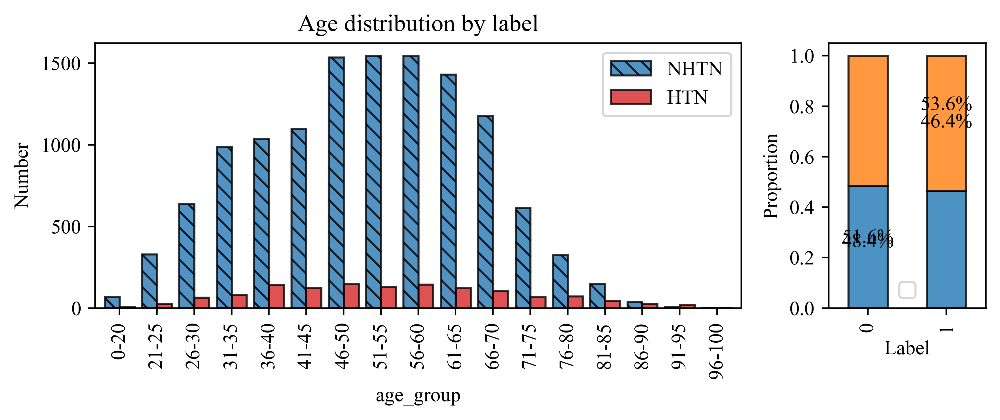

In [12]:
# 将上述两张图作为子图画在一个figsize为（7，3）的大图上
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

fig = plt.figure(layout="constrained",figsize=(7, 3),dpi = 500)
gs = GridSpec(1, 4, figure=fig)
ax1 =  fig.add_subplot(gs[0, :-1])
ax2 =  fig.add_subplot(gs[0, -1])
bins = [0, 20,25,30, 35,40, 45,50, 55,60, 65,70, 75, 80,85,90,95,100]
labels = ['0-20', '20-25', '25-30','30-35','35-40','40-45', '45-50','50-55', '55-60','60-65', '65-70','70-75', '75-80','80-85','85-90','90-95','95-100']
df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels)

# 按照label和age_group分组，计算每个组的样本占比
df_grouped = df.groupby(['label', 'age_group'])['age'].count() 

# 将数据转换为透视表，方便绘图
df_pivot = df_grouped.unstack(level=0)

# 绘制柱状图
df_pivot.plot(kind='bar', stacked=False,color = ['#2878B5','C82423'], width=0.8,alpha = 0.8,label=['NHTN','HTN'],edgecolor='k',ax = ax1)

# 设置横坐标标签
ax1.set_xticklabels(['0-20', '21-25', '26-30','31-35','36-40','41-45', '46-50','51-55', '56-60','61-65', '66-70','71-75', '76-80','81-85','86-90','91-95','96-100'])
ax1.grid(False)

# 设置标题和纵坐标标签
ax1.set_title('Age distribution by label')
ax1.set_ylabel('Number')
# 在类别为0的条形图的柱子上添加斜线条纹填充
for i, bar in enumerate(ax1.containers[0]):
    bar.set_hatch('\\\\\\')

ax1.legend(['NHTN', 'HTN'], loc='upper right')


# 绘制第二张图
grouped = df.groupby('label')['gender'].value_counts(normalize=True).unstack()
ax2 = grouped.plot(kind='bar', stacked=True,  width=0.5, alpha=0.8, edgecolor='k', ax=ax2)
ax2.set_xlabel('Label')
ax2.set_ylabel('Proportion')
ax2.legend(['Female','Male'], loc='upper right')
ax2.legend([])
for i in range(len(grouped)):
    total = sum(grouped.iloc[i])
    for j in range(len(grouped.columns)):
        percentage = grouped.iloc[i][j] / total * 100
        plt.text(i, sum(grouped.iloc[:i, j]) + grouped.iloc[i][j] / 2,
                 f'{percentage:.1f}%', ha='center')

plt.tight_layout()
plt.savefig("distribution.pdf", transparent=True)
# 显示图形
plt.show()


plt.show()

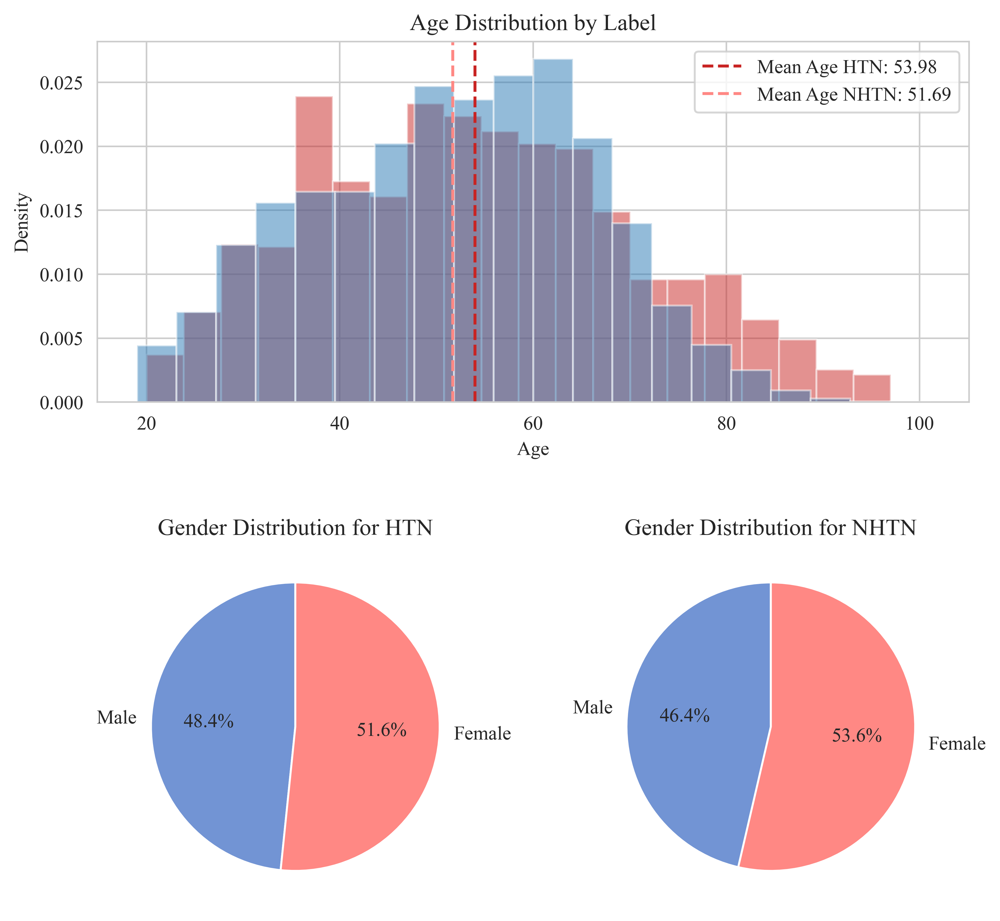

<Figure size 640x480 with 0 Axes>

In [148]:
 
# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np

# Create a figure with two subplots
fig = plt.figure(figsize=(8, 8),dpi = 500)

# Subplot 1: Age distribution
# Get data for each label
htn_age = df[df['label'] == 1]['age']
nhtn_age = df[df['label'] == 0]['age']
ax1 = fig.add_subplot(2, 1, 1)
# Plot histograms for each label
ax1.hist(htn_age, color='#C82423', alpha=0.5, density=True, bins=20)
ax1.hist(nhtn_age, color='#2878B5', alpha=0.5, density=True, bins=20)

# Calculate and plot mean for each label
htn_mean = np.mean(htn_age)
nhtn_mean = np.mean(nhtn_age)
ax1.axvline(htn_mean, color='#C82423', linestyle='--', label=f'Mean Age HTN: {htn_mean:.2f}')
ax1.axvline(nhtn_mean, color='#FF8884', linestyle='--', label=f'Mean Age NHTN: {nhtn_mean:.2f}')

# Add legend and labels
ax1.legend(frameon='w')
ax1.set_xlabel('Age')
ax1.set_ylabel('Density')
ax1.set_title('Age Distribution by Label')
# ax1.set_facecolor('none')

# Subplot 2: Gender distribution
# Get data for each label
htn_gender = df[df['label'] == 0]['gender']
nhtn_gender = df[df['label'] == 1]['gender']

# Count number of males and females for each label
htn_male = len(htn_gender[htn_gender == '女'])
htn_female = len(htn_gender[htn_gender == '男'])
nhtn_male = len(nhtn_gender[nhtn_gender == '女'])
nhtn_female = len(nhtn_gender[nhtn_gender == '男'])

# Create pie charts for each label
ax2 = fig.add_subplot(2, 2, 3)
ax3 = fig.add_subplot(2, 2, 4)
ax2.pie([htn_male, htn_female], colors=['#7294d4', '#FF8884'], autopct='%1.1f%%', startangle=90, labels=['Male', 'Female'])
ax3.pie([nhtn_male, nhtn_female], colors=['#7294d4', '#FF8884'], autopct='%1.1f%%', startangle=90,  labels=['Male', 'Female'])

# Add title
ax2.set_title('Gender Distribution for HTN')
ax3.set_title('Gender Distribution for NHTN')
# Show plot
plt.subplots_adjust(hspace=0.4)
plt.show()

plt.tight_layout()
plt.savefig("A_Distribution.pdf", transparent=True)
